# DTSA-5506 Data Mining Project

## Analyzing eCommerce Customer Dynamics: 
### Segmentation and Churn Analysis in Online Retail

In the domain of eCommerce, customer retention remains an important challenge to competing retail businesses.

This applied project utilizes data mining techniques to perform customer segmentation and churn analysis for an online retail dataset. 

Using the UCI Machine Learning Repository’s Online Retail II dataset, this project employs:
- An exploratory data analysis
- RFM analysis for categorizing customer behavior
- various clustering algorithms to extract patterns of consumer behavior and customer segmentation

        This segmentation is then evaluated for cluster distinction and usefulness.


- the development of machine learning models from the segmented dataset to predict customer churn

        The resultant churn prediction models are then evaluated for accuracy and precision.

## Library Imports

### Parallelization libraries

In [1]:
try:
    cluster.close()
    client.shutdown()
except:
    pass

In [2]:
#libraries for parallelization
import dask_ml.model_selection
import dask_ml.metrics as dd_metric
from dask.distributed import Client, LocalCluster
from dask.distributed import Adaptive

# Create a local cluster with 12 workers, each using 2 threads
cluster = LocalCluster(n_workers=12, threads_per_worker=2)
client = Client(cluster)

import optuna
from numba import jit
from joblib import parallel_backend, effective_n_jobs
#import modin.pandas as pd
import dask.dataframe as dd
from dask import config
import dask_ml.model_selection as dcv  # for Dask's cross-validation
#import dpctl (Not supported for Nvidia GPU?)
from sklearnex import patch_sklearn, config_context
patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


### Standard libraries

In [339]:
# libraries for file manipulation and warning handling
import os
import time
import logging
import warnings
from tqdm import tqdm
from joblib import dump, load
import zipfile
import gc

# Libraries for data handling
import math
import numpy as np
import pandas as pd
from collections import Counter
import requests
import random

#imports for model training and validation
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, balanced_accuracy_score, cohen_kappa_score, log_loss, matthews_corrcoef
from sklearn.metrics import make_scorer, average_precision_score, auc, roc_auc_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import precision_recall_curve, roc_curve, classification_report, confusion_matrix
from scipy.spatial.distance import cdist

#Recursive Feature Elimination
from sklearn.feature_selection import RFE 

#imports for preprocessing our data
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder, label_binarize, FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

#imports for our classifier models
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
warnings.filterwarnings('ignore', 'Windows is not officially supported for dask/xgboost, contribution are welcomed.')

#imports for clustering
from sklearn.cluster import KMeans, DBSCAN

#imports for plotting
import seaborn as sns
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patheffects as pe
%matplotlib inline

#imports for attractive printing of dataframes
from IPython.display import display

## Dataset Description

- The Online Retail II dataset is a dataset of anonymized transactions from a UK-based online-only retailer provided by the UCI MAchine Learning Repository.
- The dataset covers the period from 1/12/2009 to 09/12/2011.
- The dataset consists of 1,067,371 transaction records.
- There are 8 features in the dataset.

  **input_features:**
| input_feature | datatype       | feature_description                                                                                 | Range of Values                            |
|---------------|----------------|-----------------------------------------------------------------------------------------------------|:-------------------------------------------|
| Invoice       | Nominal String | Invoice Number; 6-digit integer unique to each transaction, a leading 'C' indicates a cancellation. | -                                          |
| StockCode     | Nominal String | A 5-digit integer unique to each distinct product.                                                  | -                                          |
| Description   | Nominal String | Product name.                                                                                       | -                                          |
| Quantity      | Integer        | Quantity of product per transaction.                                                                | [-80,995, 80,995]                          |
| InvoiceDate   | DateTime       | Day and time of transaction generation.                                                             | [2009-12-01 07:45:00, 2011-12-09 12:50:00] |
| Price         | Float          | Product price per unit in GBP.                                                                      | [-53594.36, 38970.0]                       |
| Customer ID   | Nominal String | A 5-digit integer unique to each customer.                                                          | [12346, 18287]                             |
| Country       | Categorical    | The name of the customer's country of residence.                                                    | {United Kingdom :92%, EIRE 2%, Other 6%}   |

 **target_feature:**
 
                                                 A customer is considered churned if they have not had a transaction within the past 90 days.
 
| target_feature | datatype | feature_description | Range of values |
|------------|-----------------|---------|:---------|
| Is_Churned | Integer/Boolean | A flag for whether the customer has been 'churned' (ended commercial relationship) | {0: Not churned, 1: Churned} |
 

## Data Import

### EDA Pull Functions

In [4]:
def pull_data(data_url = r"https://archive.ics.uci.edu/static/public/502/online+retail+ii.zip", extraction_directory ="data", user_file_name = "data", rem_filename = "online_retail_ii.zip"):
    
    os.chdir(r"C:\Users\willa\Documents\GitHub\DTSA-5506_Final_Project")    
    
    response = requests.get(data_url)

    print(response.raise_for_status())
    
    with open(rem_filename, "wb") as f:
        f.write(response.content)

    counter = 0
    stored_file_name = []
    try:
        with zipfile.ZipFile(rem_filename, 'r') as zip_ref:
            zip_ref.extractall(user_file_name)
            
            for member in zip_ref.namelist():
                if counter == 0:
                    counter_str = ""
                else:
                    counter_str = str(counter)
                    
                counter += 1
                zip_ref.extract(member, extraction_directory)
                original_path = os.path.join(extraction_directory, member)
                new_path = os.path.join(extraction_directory, user_file_name + counter_str + "." + member.split(".")[1])
                stored_file_name.append(user_file_name + counter_str + "." + member.split(".")[1])
                try:    
                    os.rename(original_path, new_path)
                except:
                    print("File already exists")
                os.remove(original_path)
    except:
        os.remove(rem_filename)
        return user_file_name
    
    os.remove(rem_filename)

    return extraction_directory, stored_file_name

In [5]:
def data_to_pd(dir, data):
    try:
        with open(dir + "\\" + data[0] + ".gz", "wb") as f:
            df = load(f)
            
        if df.shape()[0] < 1000000:
            raise ValueError("\nStored DataFrame too short, re-pulling from data file.")
        else:
            pass
            
    except:
        df = pd.concat(pd.read_excel(dir + "\\" + data[0], sheet_name=None), ignore_index=True)
        with open(dir + "\\" + data[0] + ".gz", "wb") as f:
            dump(df, f)
        
    return df

### data_handler class for preprocessing, clustering, and modeling

In [611]:
class data_handler():
    def __init__(self):
        #pull the data
        self.dir, self.file_name = self.pull_data()
        
        #transform the data to dataframe
        self.data = self.data_to_df(self.dir, self.file_name)

        #clean the data
        self.data = self.clean_data()
        
        #preprocess the data
        self.data = self.pre_process()
        
        #prepare the RFM dataset
        self.rfm = self.RFM()
        self.rfm_scaled = self.rfm_log_scale()
        self.rfm_quality = self.RFM_Quality(self.RFM())
        self.rfm_quality_scaled = self.RFM_Quality(self.rfm_log_scale())
        
        #clean and rfm get train-test split
        self.clean_data.train, self.clean_data.test = train_test_split(self.clean_data, test_size=0.2, random_state=5)
        self.rfm.train, self.rfm.test = train_test_split(self.rfm, test_size=0.2, random_state=5)

    
    def pull_data(self, data_url=r"https://archive.ics.uci.edu/static/public/502/online+retail+ii.zip", extraction_directory="data", user_file_name="data", rem_filename="online_retail_ii.zip"):
        # Check if the file is already downloaded
        if not os.path.exists(rem_filename):
            response = requests.get(data_url)
            response.raise_for_status()
            with open(rem_filename, "wb") as f:
                f.write(response.content)
        
        stored_file_name = []
        try:
            with zipfile.ZipFile(rem_filename, 'r') as zip_ref:
                # Extract only if the directory doesn't exist
                if not os.path.exists(user_file_name):
                    zip_ref.extractall(user_file_name)
                
                for counter, member in enumerate(zip_ref.namelist(), 1):
                    # Renaming logic
                    original_path = os.path.join(extraction_directory, member)
                    file_extension = member.split(".")[1]
                    new_name = f"{user_file_name}{counter if counter > 1 else ''}.{file_extension}"
                    new_path = os.path.join(extraction_directory, new_name)
                    stored_file_name.append(new_name)
                    
                    if not os.path.exists(new_path):
                        zip_ref.extract(member, extraction_directory)
                        os.rename(original_path, new_path)
        except:
            if os.path.exists(rem_filename):
                os.remove(rem_filename)
            return user_file_name
        
        if os.path.exists(rem_filename):
            os.remove(rem_filename)
        
        return extraction_directory, stored_file_name

    def data_to_df(self, dir, file):
        gz_file_path = os.path.join(dir, file[0] + ".gz")
        try:
            with open(gz_file_path, "rb") as f:
                df = load(f)
            if df.shape[0] < 1000000:
                raise ValueError("\nStored DataFrame too short, re-pulling from data file.")
        except (EOFError, ValueError):
            # Handle corrupted/incomplete file by recreating it
            excel_file_path = os.path.join(dir, file[0])
            df = pd.concat(pd.read_excel(excel_file_path, sheet_name=None), ignore_index=True)
            with open(gz_file_path, "wb") as f:
                dump(df, f)
        return df

    def pre_process(self):
        self.data['Spend'] = self.data['Quantity'] * self.data['Price']
        self.data['Date'] = self.data['InvoiceDate'].dt.date
        self.data['Time'] = self.data['InvoiceDate'].dt.time
        self.data['Year'] = self.data['InvoiceDate'].dt.date.apply(lambda x : x.year)
        self.data['Month'] = self.data['InvoiceDate'].dt.date.apply(lambda x : x.month)
        self.data['Day'] = self.data['InvoiceDate'].dt.date.apply(lambda x : x.day)
        
        
        return self.data
    
    def clean_data(self):
        self.clean_data = self.data[~self.data['Customer ID'].isna()]

        return self.clean_data
    
    def RFM(self):
        #one additional day is needed as an offset for calculating difference from most_recent_datetime for all transactions
        most_recent_datetime = self.data['InvoiceDate'].max() + pd.DateOffset(days=1) 
        recency = self.data.groupby('Customer ID')['InvoiceDate'].max().reset_index()
        recency.columns = ['Customer ID', 'DateOfLastPurchase']
        recency['Recency'] = (most_recent_datetime - recency['DateOfLastPurchase']).dt.days

        #grouping by Customer ID and getting unique transactions
        frequency = self.data.groupby('Customer ID')['Invoice'].nunique().reset_index()
        frequency.columns = ['Customer ID', 'Frequency']

        #grouping by Customer ID and getting total spend
        monetary = self.data.groupby('Customer ID').apply(lambda x: x['Price'] * x['Quantity']).groupby('Customer ID').sum().reset_index()
        monetary.columns = ['Customer ID', 'Monetary']

        rfm = recency.merge(frequency, on='Customer ID').merge(monetary, on='Customer ID')

        #RFM score (4 scoring levels based on quartiles)
        labels = [i for i in range(1, 5)]
        
        rfm['R'] = pd.qcut(rfm['Recency'], 4, labels=labels)
        
        rfm['F'] = pd.qcut(rfm['Frequency'], 4, labels=labels, duplicates='drop')
         
        rfm['M'] = pd.qcut(rfm['Monetary'], 4, labels=labels, duplicates='drop')

        rfm['RFM_Score'] = rfm['R'].astype(str) + rfm['F'].astype(str) + rfm['M'].astype(str)

        #return rfm where Monetary is non-negative
        return rfm[rfm['Monetary'] >= 0]

    def rfm_log_scale(self):
        #Helper function for our KMeans clustering
        #Need to log-transform and scale data
        def log_transform(x):
            return np.log(x+1)
        
        scaler = StandardScaler()
        transformer = FunctionTransformer(log_transform, validate=True)
        
        orig_cols = self.rfm.columns
        mycols = ['Recency', 'Frequency', 'Monetary']
        
        pipe = Pipeline(steps=[ 
                ("selector", ColumnTransformer([
                    ("selector", "passthrough", mycols)
                ], remainder="drop")), 
                ('log_transformer', transformer), 
                ('scaler', scaler)
            ])
        
        df_transform = pd.DataFrame(pipe.fit_transform(self.rfm), columns=mycols)

        # Reset the index of both DataFrames before merging
        self.rfm.reset_index(drop=True, inplace=True)
        df_transform.reset_index(drop=True, inplace=True)
        
        df_transform = pd.concat([self.rfm[['Customer ID', 'DateOfLastPurchase', 'R', 'F', 'M', 'RFM_Score']], df_transform], axis=1)[orig_cols]
        
        return df_transform

    def RFM_Quality(self, df):
        #Helper function to qualitatively score the RFM values
        # Define the conditions and corresponding quality values
        conditions = [
            ((df['R'] == 1) & (df['F'] == 1)), # New Customer
            ((df['R'] == 1) & (df['F'] == 4)), # High Activity
            ((df['F'] == 4) & (df['M'] == 4)), # High Loyalty, High Spend
            ((df['R'] == 1) & (df['F'] == 4) & (df['M'] == 4)), # Prime Customer
            ((df['R'] == 4) & (df['M'] == 4)), # High Value, Inactive
            ((df['R'] == 4) & (df['F'] == 4)), # High Loyalty, Inactive
            ((df['R'] == 4) & (df['F'] == 4) & (df['M'] == 4)),  # High Loyalty, High Spend, Inactive
            ((df['R'] == 4) & (df['F'] == 4) & (df['M'] == 3)),  # High Loyalty, High Spend, Inactive
            ((df['R'] == 4) & (df['F'] == 3) & (df['M'] == 4)),  # High Loyalty, High Spend, Inactive
            ((df['R'] == 4) & (df['F'] == 3) & (df['M'] == 3)),  # High Loyalty, High Spend, Inactive
            ((df['R'] == 3) & (df['F'] == 4) & (df['M'] == 4)),  # Moderate Recency, High Frequency, High Spend
            ((df['R'] > 2) & (df['F'] <= 2) & (df['M'] <= 2))  # Low Recency, Low Frequency, Low Spend (Potential Churn)
        ]
        
        quality_values = [
            'New_Customer',
            'High_Activity',
            'High_Loyalty_High_Spend',
            'Prime_Customer',
            'High_Value_Inactive', # At-Risk: High Value, Inactive
            'High_Loyalty_Inactive', # At-Risk: High Loyalty, Inactive
            'High_Loyalty_High_Spend_Inactive',  # At-Risk: High Loyalty, High Spend, Inactive
            'High_Loyalty_High_Spend_Inactive',  # At-Risk: High Loyalty, High Spend, Inactive
            'High_Loyalty_High_Spend_Inactive',  # At-Risk: High Loyalty, High Spend, Inactive
            'High_Loyalty_High_Spend_Inactive',  # At-Risk: High Loyalty, High Spend, Inactive
            'Moderate_Recency_High_Frequency_High_Spend',  # At-Risk: Moderate Recency, High Frequency, High Spend
            'Potential_Churn'  # At-Risk: Potential Churn
        ]
        
        # Use np.select to apply the conditions and assign the quality values
        df['Quality'] = np.select(conditions, quality_values, default='Other')
    
        #repeating pattern above for at-risk
        at_risk_conditions = [
            (df['Quality'] == 'High_Value_Inactive'),
            (df['Quality'] == 'High_Loyalty_Inactive'),
            (df['Quality'] == 'High_Loyalty_High_Spend_Inactive'),
            (df['Quality'] == 'Moderate_Recency_High_Frequency_High_Spend'),
            (df['Quality'] == 'Potential_Churn'),
        ]
    
        at_risk_values = [
            True,
            True,
            True,
            True,
            True
        ] 
    
        df['At_Risk'] = np.select(at_risk_conditions, at_risk_values, default=False)
    
        #repeating pattern above for loyal-customer
        loyalty_conditions = [
            (df['Quality'] == 'Prime_Customer'),
            (df['Quality'] == 'High_Activity'),
            (df['Quality'] == 'High_Loyalty_High Spend')
        ]
    
        loyalty_values = [
            True,
            True,
            True
        ] 
    
        df['Loyal_Interest'] = np.select(loyalty_conditions, loyalty_values, default=False)
    
        #Add Some additional quality flags
        df['Is_High_Value'] = df.apply(lambda x : True if x['M'] >= 3 else False, axis=1)
        df['Is_High_Activity'] = df.apply(lambda x : True if x['F'] >= 4 else False, axis=1)
        df['Is_Recent'] = df.apply(lambda x : True if x['R'] <= 2 else False, axis=1)
        
        # Print the updated DataFrame
        return df
    
    def cluster(self, type='KMeans', k=5):
        #helper function for clustering
        #params:
        #type - string for clustering method
        
        types = ['DBSCAN', 'KMeans']
        if type not in types:
            raise ValueError(f'Invalid Cluster Type. Expected one of {types}')

        match type:
            case 'KMeans':
                data = self.rfm_log_scale()
                cls_model = KMeans(n_clusters = k, random_state = 5, n_init= 'auto')
                cls_model = cls_model.fit(data[['Recency', 'Frequency', 'Monetary']])
                data['Cluster'] = cls_model.predict(data[['Recency', 'Frequency', 'Monetary']])
                self.rfm_KM_cluster = data
                self.cls_model = cls_model
                print(
                    'rfm_cluster created',
                    '\ncls_model created'
                )

            case 'DBSCAN':
                data = self.rfm_log_scale()
                cls_model = DBSCAN()
                cls_model = cls_model.fit(data[['Recency', 'Frequency', 'Monetary']])
                data['Cluster'] = cls_model.fit_predict(data[['Recency', 'Frequency', 'Monetary']])
                self.rfm_DBSCAN_cluster = data
                self.cls_model = cls_model
                print(
                    'rfm_cluster created',
                    '\ncls_model created'
                )

    def elbow_plot(self, max_k = 5):
        #helper function to plot KMeans elbow plots
        inertias = []

        k_range = range(1, max_k+1)
        
        for k in k_range:
            print(k)
            self.cluster(type='KMeans', k=k)
            cls_model = self.cls_model
            inertia = cls_model.inertia_
            inertias.append(inertia)
            
        plt.plot(k_range, distortions, 'bx-')
        plt.xlabel('Values for K')
        plt.ylabel['Inertia']
        plt.title('Elbow-Method w/ Inertia')

        plt.show()

    def RFM_3D_Plot(self, data, cluster_col = 'Cluster'):

        from mpl_toolkits.mplot3d import Axes3D

        #make the 3D plot interactive
        %matplotlib widget

        fig = plt.figure(figsize=(10, 8))  # Added figsize for a bigger plot
        ax=fig.add_subplot(111, projection='3d')
        
        # Scatter plot
        # Get unique clusters and corresponding colors
        unique_clusters = np.unique(data[cluster_col])
        colors = plt.cm.Set1(np.linspace(0, 1, len(unique_clusters)))
        
        # Loop through unique clusters to plot and add legend entry
        for cluster, color in zip(unique_clusters, colors):
            mask = (data[cluster_col] == cluster)
            ax.scatter3D(xs=data.Recency[mask], 
                         ys=data.Frequency[mask], 
                         zs=data.Monetary[mask], 
                         s=40, 
                         c=[color for _ in range(np.sum(mask))],  # Specify a single color for all points in this scatter
                         alpha=0.4,
                         depthshade=True,
                         label=f'Cluster {cluster}')  # add label for legend
        
        # Adding labels for clarity
        ax.set_xlabel('Recency')
        ax.set_ylabel('Frequency')
        ax.set_zlabel('Monetary')
        
        ax.legend(loc='upper right')  # Display the legend
        
        display(fig)

### Begin Data Pull

In [612]:
os.chdir(r"C:\Users\willa\Documents\GitHub\DTSA-5506_Final_Project")

In [613]:
os.getcwd()

'C:\\Users\\willa\\Documents\\GitHub\\DTSA-5506_Final_Project'

In [614]:
handler = data_handler()

C:\Users\willa\AppData\Local\Temp\ipykernel_4644\2697169998.py:22: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  self.clean_data.train, self.clean_data.test = train_test_split(self.clean_data, test_size=0.2, random_state=5)
C:\Users\willa\AppData\Local\Temp\ipykernel_4644\2697169998.py:23: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  self.rfm.train, self.rfm.test = train_test_split(self.rfm, test_size=0.2, random_state=5)


In [615]:
handler.data

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Spend,Date,Time,Year,Month,Day
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom,83.40,2009-12-01,07:45:00,2009,12,1
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,81.00,2009-12-01,07:45:00,2009,12,1
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,81.00,2009-12-01,07:45:00,2009,12,1
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom,100.80,2009-12-01,07:45:00,2009,12,1
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom,30.00,2009-12-01,07:45:00,2009,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067366,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60,2011-12-09,12:50:00,2011,12,9
1067367,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,12:50:00,2011,12,9
1067368,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60,2011-12-09,12:50:00,2011,12,9
1067369,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,2011-12-09 12:50:00,4.95,12680.0,France,14.85,2011-12-09,12:50:00,2011,12,9


In [11]:
dir, data = pull_data()
df =  data_to_pd(dir, data)

None
File already exists


## Exploratory Data Analysis

In [12]:
df.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom


In [13]:
df.shape

(1067371, 8)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1067371 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   Invoice      1067371 non-null  object        
 1   StockCode    1067371 non-null  object        
 2   Description  1062989 non-null  object        
 3   Quantity     1067371 non-null  int64         
 4   InvoiceDate  1067371 non-null  datetime64[ns]
 5   Price        1067371 non-null  float64       
 6   Customer ID  824364 non-null   float64       
 7   Country      1067371 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 65.1+ MB


In [15]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Quantity,1067371.0,9.938898,-80995.0,1.0,3.0,10.0,80995.0,172.705794
InvoiceDate,1067371,2011-01-02 21:13:55.394028544,2009-12-01 07:45:00,2010-07-09 09:46:00,2010-12-07 15:28:00,2011-07-22 10:23:00,2011-12-09 12:50:00,NaN
Price,1067371.0,4.649388,-53594.36,1.25,2.1,4.15,38970.0,123.553059
Customer ID,824364.0,15324.638504,12346.0,13975.0,15255.0,16797.0,18287.0,1697.46445


In [16]:
df.isna().sum()

Invoice             0
StockCode           0
Description      4382
Quantity            0
InvoiceDate         0
Price               0
Customer ID    243007
Country             0
dtype: int64

In [17]:
print(f"Number of customers in the dataset: {df['Customer ID'].nunique()}")
print(f"\nNumber of unique invoices: {df['Invoice'].nunique()}")
print( f"\nMinimum Invoice Date: {df.InvoiceDate.min()}", f"\nMaximum Invoice Date: {df.InvoiceDate.max()}")

Number of customers in the dataset: 5942

Number of unique invoices: 53628

Minimum Invoice Date: 2009-12-01 07:45:00 
Maximum Invoice Date: 2011-12-09 12:50:00


In [18]:
print("Number of txns per:")
df['Customer ID'].value_counts()

Number of txns per:


Customer ID
17841.0    13097
14911.0    11613
12748.0     7307
14606.0     6709
14096.0     5128
           ...  
14580.0        1
16154.0        1
16443.0        1
15233.0        1
17948.0        1
Name: count, Length: 5942, dtype: int64

In [19]:
print(f"Total volume of products sold in the dataset: {df['Quantity'].sum()}")

Total volume of products sold in the dataset: 10608492


In [20]:
df.Invoice.value_counts()

Invoice
537434     1350
538071     1304
537638     1202
537237     1194
536876     1186
           ... 
C518262       1
548515        1
C548513       1
C524395       1
559376        1
Name: count, Length: 53628, dtype: int64

### Initial Notes:

Large dataset, > 1000000 records/transactions.

Price and Quantity include negative values.

Quantity varies between personal consumer and wholesale quantities.

A large number of Customer ID entries appear to be NaN - needs to be investigated if data error, missing, or intentional NaN for sequential entries for a customer's transactions.

A small number of Description entries are NaN.

Some customers make a very large number of transactions.

Invoice number appears to be re-used between transactions - investigate.

In [21]:
def EDA_Summary(df):
    print(f"DataFrame Shape: {df.shape} \n")
    print(df.info())
    display(df.describe().T)
    print(f" NaN values: {df.isna().sum()}")
    print(f"Number of customers in the dataset: {df['Customer ID'].nunique()}")
    print(f"\nNumber of unique invoices: {df['Invoice'].nunique()}")
    print( f"\nMinimum Invoice Date: {df.InvoiceDate.min()}", f"\nMaximum Invoice Date: {df.InvoiceDate.max()}")
    print("Number of txns per:")
    print(df['Customer ID'].value_counts())
    print(f"Total volume of products sold in the dataset: {df['Quantity'].sum()}")
    print(f"Total monetary value of products sold: {(df.Quantity * df.Price).sum()}")
    print(f"Distribution of customer country of residence: {df['Country'].value_counts(normalize=True).head(10) * 100}")

In [22]:
EDA_Summary(df)

DataFrame Shape: (1067371, 8) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1067371 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   Invoice      1067371 non-null  object        
 1   StockCode    1067371 non-null  object        
 2   Description  1062989 non-null  object        
 3   Quantity     1067371 non-null  int64         
 4   InvoiceDate  1067371 non-null  datetime64[ns]
 5   Price        1067371 non-null  float64       
 6   Customer ID  824364 non-null   float64       
 7   Country      1067371 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 65.1+ MB
None


,count,mean,min,25%,50%,75%,max,std
Quantity,1067371.0,9.938898,-80995.0,1.0,3.0,10.0,80995.0,172.705794
InvoiceDate,1067371,2011-01-02 21:13:55.394028544,2009-12-01 07:45:00,2010-07-09 09:46:00,2010-12-07 15:28:00,2011-07-22 10:23:00,2011-12-09 12:50:00,NaN
Price,1067371.0,4.649388,-53594.36,1.25,2.1,4.15,38970.0,123.553059
Customer ID,824364.0,15324.638504,12346.0,13975.0,15255.0,16797.0,18287.0,1697.46445


 NaN values: Invoice             0
StockCode           0
Description      4382
Quantity            0
InvoiceDate         0
Price               0
Customer ID    243007
Country             0
dtype: int64
Number of customers in the dataset: 5942

Number of unique invoices: 53628

Minimum Invoice Date: 2009-12-01 07:45:00 
Maximum Invoice Date: 2011-12-09 12:50:00
Number of txns per:
Customer ID
17841.0    13097
14911.0    11613
12748.0     7307
14606.0     6709
14096.0     5128
           ...  
14580.0        1
16154.0        1
16443.0        1
15233.0        1
17948.0        1
Name: count, Length: 5942, dtype: int64
Total volume of products sold in the dataset: 10608492
Total monetary value of products sold: 19287250.56799999
Distribution of customer country of residence: Country
United Kingdom    91.938979
EIRE               1.673832
Germany            1.651160
France             1.342551
Netherlands        0.481557
Spain              0.357045
Switzerland        0.298771
Belgium        

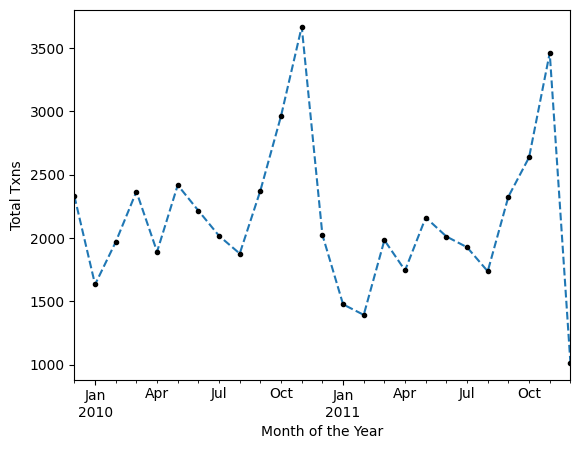

In [23]:
ax = df.set_index('InvoiceDate').resample("M")["Invoice"].nunique().plot(marker=".", 
                                                                         linestyle="--", 
                                                                         markerfacecolor="black",
                                                                         markeredgecolor="black"
                                                                         )
ax.set_ylabel("Total Txns")
ax.set_xlabel("Month of the Year");

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


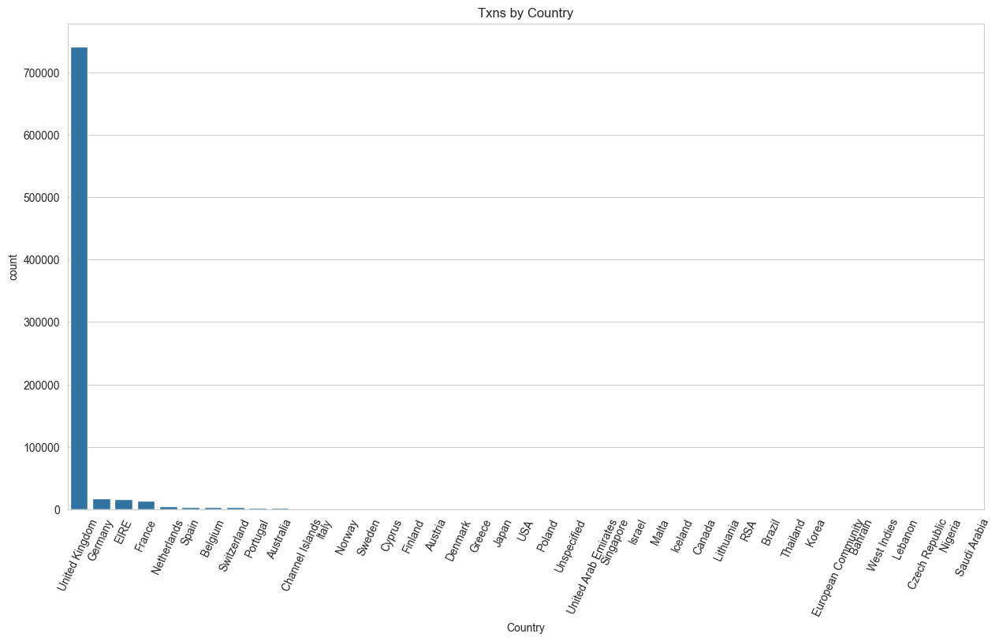

In [24]:
sns.set_style("whitegrid")
plt.figure(figsize = (15,8))
plt.xticks(rotation=65,size=10)
sns.countplot(x='Country', data=handler.data, order = handler.data.Country.value_counts().index)
plt.title('Txns by Country')
plt.show()

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


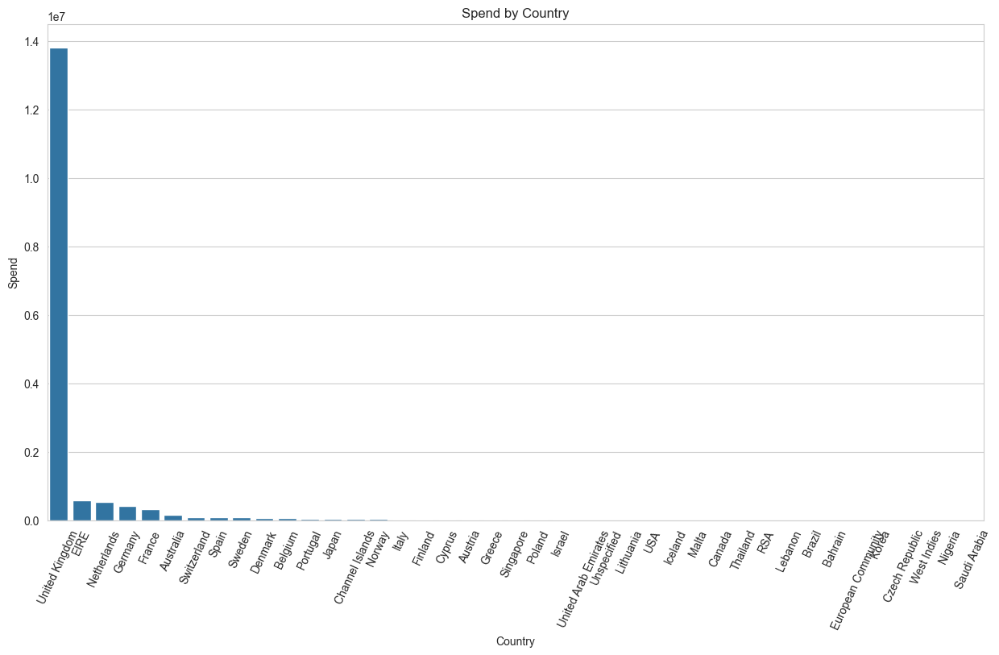

In [25]:
sns.set_style("whitegrid")
plt.figure(figsize = (15,8))
plt.xticks(rotation=65,size=10)
sns.barplot(x='Country', y='Spend', data=pd.DataFrame(handler.data.groupby('Country')['Spend'].sum().sort_values(ascending=False)).reset_index(), order = handler.data.groupby('Country')['Spend'].sum().sort_values(ascending=False).index)
plt.title('Spend by Country')
plt.show()

### NaN Investigation

In [26]:
df[df['Customer ID'].isna()]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
263,489464,21733,85123a mixed,-96,2009-12-01 10:52:00,0.00,NaN,United Kingdom
283,489463,71477,short,-240,2009-12-01 10:52:00,0.00,NaN,United Kingdom
284,489467,85123A,21733 mixed,-192,2009-12-01 10:53:00,0.00,NaN,United Kingdom
470,489521,21646,NaN,-50,2009-12-01 11:44:00,0.00,NaN,United Kingdom
577,489525,85226C,BLUE PULL BACK RACING CAR,1,2009-12-01 11:49:00,0.55,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
1066997,581498,85099B,JUMBO BAG RED RETROSPOT,5,2011-12-09 10:26:00,4.13,NaN,United Kingdom
1066998,581498,85099C,JUMBO BAG BAROQUE BLACK WHITE,4,2011-12-09 10:26:00,4.13,NaN,United Kingdom
1066999,581498,85150,LADIES & GENTLEMEN METAL SIGN,1,2011-12-09 10:26:00,4.96,NaN,United Kingdom
1067000,581498,85174,S/4 CACTI CANDLES,1,2011-12-09 10:26:00,10.79,NaN,United Kingdom


In [27]:
#Negative values will be investigated in the section below

#checking the postiive values quantities with NaN Customer ID
df[df['Customer ID'].isna() & (df.Quantity > 0)]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
577,489525,85226C,BLUE PULL BACK RACING CAR,1,2009-12-01 11:49:00,0.55,NaN,United Kingdom
578,489525,85227,SET/6 3D KIT CARDS FOR KIDS,1,2009-12-01 11:49:00,0.85,NaN,United Kingdom
1055,489548,22271,FELTCRAFT DOLL ROSIE,1,2009-12-01 12:32:00,2.95,NaN,United Kingdom
1056,489548,22254,FELT TOADSTOOL LARGE,12,2009-12-01 12:32:00,1.25,NaN,United Kingdom
1057,489548,22273,FELTCRAFT DOLL MOLLY,3,2009-12-01 12:32:00,2.95,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
1066997,581498,85099B,JUMBO BAG RED RETROSPOT,5,2011-12-09 10:26:00,4.13,NaN,United Kingdom
1066998,581498,85099C,JUMBO BAG BAROQUE BLACK WHITE,4,2011-12-09 10:26:00,4.13,NaN,United Kingdom
1066999,581498,85150,LADIES & GENTLEMEN METAL SIGN,1,2011-12-09 10:26:00,4.96,NaN,United Kingdom
1067000,581498,85174,S/4 CACTI CANDLES,1,2011-12-09 10:26:00,10.79,NaN,United Kingdom


In [28]:
df[df['Customer ID'].isna() & (df.Quantity > 0)].Invoice.value_counts()

Invoice
537434    1350
538071    1304
537638    1202
537237    1194
536876    1186
          ... 
511530       1
511528       1
511527       1
511525       1
506825       1
Name: count, Length: 4969, dtype: int64

These appear to be erroneous entries, no pattern and no associated Customer ID

### Negative Values Investigation
- Appears to be cancelled orders

In [29]:
df[df.Quantity < 0]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
178,C489449,22087,PAPER BUNTING WHITE LACE,-12,2009-12-01 10:33:00,2.95,16321.0,Australia
179,C489449,85206A,CREAM FELT EASTER EGG BASKET,-6,2009-12-01 10:33:00,1.65,16321.0,Australia
180,C489449,21895,POTTING SHED SOW 'N' GROW SET,-4,2009-12-01 10:33:00,4.25,16321.0,Australia
181,C489449,21896,POTTING SHED TWINE,-6,2009-12-01 10:33:00,2.10,16321.0,Australia
182,C489449,22083,PAPER CHAIN KIT RETRO SPOT,-12,2009-12-01 10:33:00,2.95,16321.0,Australia
...,...,...,...,...,...,...,...,...
1065910,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.0,United Kingdom
1067002,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.0,United Kingdom
1067176,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.0,United Kingdom
1067177,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.0,United Kingdom


In [30]:
#checking negative quantity orders with a non-leading C Invoice number
df[(df.Quantity < 0) & ~df.Invoice.str.contains("C", na=False)]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
263,489464,21733,85123a mixed,-96,2009-12-01 10:52:00,0.0,NaN,United Kingdom
283,489463,71477,short,-240,2009-12-01 10:52:00,0.0,NaN,United Kingdom
284,489467,85123A,21733 mixed,-192,2009-12-01 10:53:00,0.0,NaN,United Kingdom
470,489521,21646,NaN,-50,2009-12-01 11:44:00,0.0,NaN,United Kingdom
3114,489655,20683,NaN,-44,2009-12-01 17:26:00,0.0,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
1060794,581210,23395,check,-26,2011-12-07 18:36:00,0.0,NaN,United Kingdom
1060796,581212,22578,lost,-1050,2011-12-07 18:38:00,0.0,NaN,United Kingdom
1060797,581213,22576,check,-30,2011-12-07 18:38:00,0.0,NaN,United Kingdom
1062371,581226,23090,missing,-338,2011-12-08 09:56:00,0.0,NaN,United Kingdom


In [31]:
#Appears to be NaN Customer IDs above

#checking if any records with negative quantity, no cancellation invoice, and a valid Customer ID
df[(df.Quantity < 0) & ~df.Invoice.str.contains("C", na=False) & (~df['Customer ID'].isna())]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country


These appear to be data errors and will be removed from the dataset.

In [32]:
df_proc = df[~df['Customer ID'].isna()]

In [33]:
EDA_Summary(df_proc)

DataFrame Shape: (824364, 8) 

<class 'pandas.core.frame.DataFrame'>
Index: 824364 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Invoice      824364 non-null  object        
 1   StockCode    824364 non-null  object        
 2   Description  824364 non-null  object        
 3   Quantity     824364 non-null  int64         
 4   InvoiceDate  824364 non-null  datetime64[ns]
 5   Price        824364 non-null  float64       
 6   Customer ID  824364 non-null  float64       
 7   Country      824364 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 56.6+ MB
None


,count,mean,min,25%,50%,75%,max,std
Quantity,824364.0,12.414574,-80995.0,2.0,5.0,12.0,80995.0,188.976099
InvoiceDate,824364,2011-01-01 22:29:28.042054144,2009-12-01 07:45:00,2010-07-06 11:58:00,2010-12-03 14:26:00,2011-07-27 15:14:00,2011-12-09 12:50:00,NaN
Price,824364.0,3.6768,0.0,1.25,1.95,3.75,38970.0,70.241388
Customer ID,824364.0,15324.638504,12346.0,13975.0,15255.0,16797.0,18287.0,1697.46445


 NaN values: Invoice        0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
Price          0
Customer ID    0
Country        0
dtype: int64
Number of customers in the dataset: 5942

Number of unique invoices: 44876

Minimum Invoice Date: 2009-12-01 07:45:00 
Maximum Invoice Date: 2011-12-09 12:50:00
Number of txns per:
Customer ID
17841.0    13097
14911.0    11613
12748.0     7307
14606.0     6709
14096.0     5128
           ...  
14580.0        1
16154.0        1
16443.0        1
15233.0        1
17948.0        1
Name: count, Length: 5942, dtype: int64
Total volume of products sold in the dataset: 10234128
Total monetary value of products sold: 16648292.388
Distribution of customer country of residence: Country
United Kingdom    89.923990
Germany            2.137891
EIRE               1.964545
France             1.722783
Netherlands        0.623511
Spain              0.462296
Belgium            0.378838
Switzerland        0.371680
Portugal           0.303749
Aust

In [34]:
print(f"\nPercent reduction in Customers by cleaning NaN IDs: {(df_proc['Customer ID'].nunique() - df['Customer ID'].nunique())/ df['Customer ID'].nunique() : 0.2%}")
print(f"\nPercent reduction in Invoices by cleaning NaN IDs: {(df_proc.Invoice.nunique() - df.Invoice.nunique())/ df.Invoice.nunique() : 0.2%}")
print(f"\nPercent reduction in Transactions by cleaning NaN IDs: {(df_proc.shape[0] - df.shape[0]) / df.shape[0] : 0.2%}")


Percent reduction in Customers by cleaning NaN IDs:  0.00%

Percent reduction in Invoices by cleaning NaN IDs: -16.32%

Percent reduction in Transactions by cleaning NaN IDs: -22.77%


## RFM Analysis (Recency, Frequency, Monetary)
- Recency : Days Since Last Transaction
- Frequency : Number of Unique transactions
- Monetary : Total Spend
- RFM Score : Aggregate Segmentation Score

In [35]:
handler.rfm

,Customer ID,DateOfLastPurchase,Recency,Frequency,Monetary,R,F,M,RFM_Score
0,12347.0,2011-12-07 15:52:00,2,8,5633.32,1,3,4,134
1,12348.0,2011-09-25 13:13:00,75,5,2019.40,2,3,3,233
2,12349.0,2011-11-21 09:51:00,19,5,4404.54,1,3,4,134
3,12350.0,2011-02-02 16:01:00,310,1,334.40,3,1,2,312
4,12351.0,2010-11-29 15:23:00,375,1,300.93,3,1,1,311
...,...,...,...,...,...,...,...,...,...
5852,18283.0,2011-12-06 12:02:00,4,22,2736.65,1,4,4,144
5853,18284.0,2010-10-06 12:31:00,430,2,436.68,4,1,2,412
5854,18285.0,2010-02-17 10:24:00,661,1,427.00,4,1,2,412
5855,18286.0,2010-08-20 11:57:00,477,3,1188.43,4,2,3,423


### RFM Plots

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Monetary', ylabel='Count'>

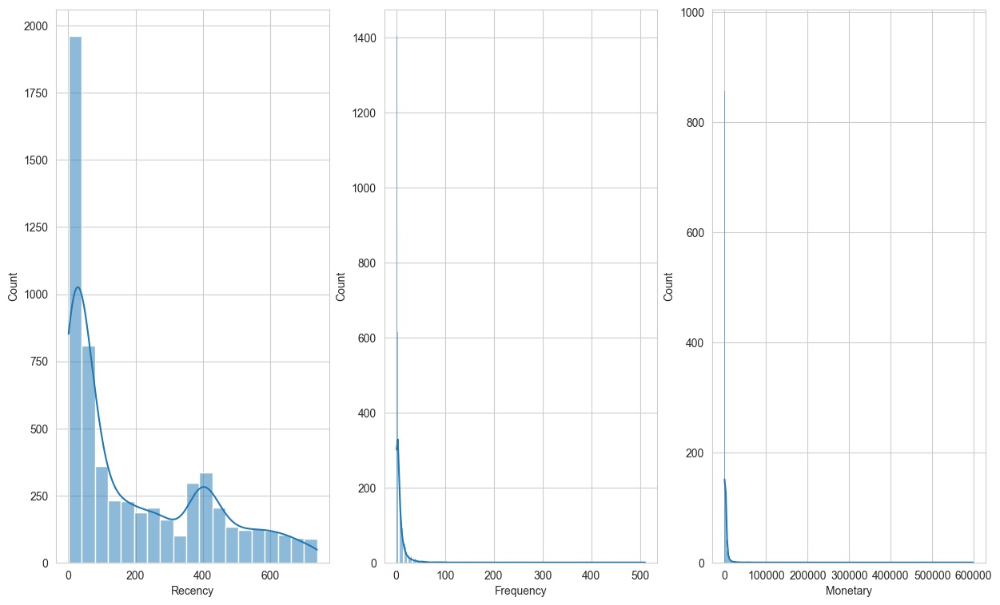

In [37]:
fig, axes = plt.subplots(1, 3, figsize = (15, 9))
for ax in axes:
    ax.set_ylabel('Count')

sns.histplot(handler.rfm['Recency'], kde=True, ax=axes[0])
sns.histplot(handler.rfm['Frequency'], kde=True, ax=axes[1])
sns.histplot(handler.rfm['Monetary'], kde=True, ax=axes[2])

In [38]:
handler.rfm[handler.rfm['Monetary'] > 20000].count()

Customer ID           94
DateOfLastPurchase    94
Recency               94
Frequency             94
Monetary              94
R                     94
F                     94
M                     94
RFM_Score             94
dtype: int64

In [39]:
handler.rfm[handler.rfm['Frequency'] > 100].count()

Customer ID           23
DateOfLastPurchase    23
Recency               23
Frequency             23
Monetary              23
R                     23
F                     23
M                     23
RFM_Score             23
dtype: int64

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Monetary < 20000')

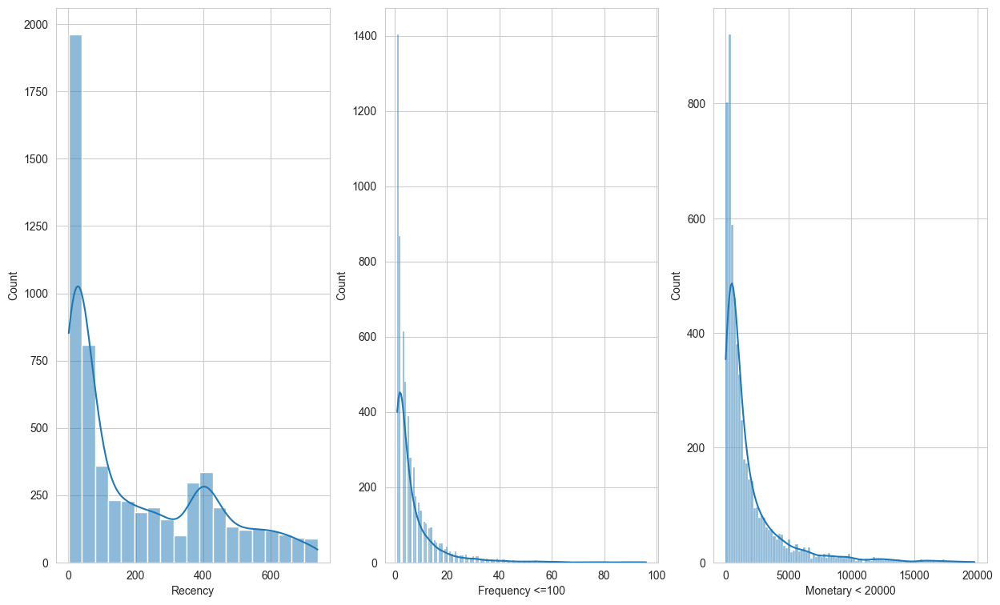

In [40]:
fig, axes = plt.subplots(1, 3, figsize = (15, 9))
for ax in axes:
    ax.set_ylabel('Count')

sns.histplot(handler.rfm['Recency'], kde=True, ax=axes[0])
sns.histplot(handler.rfm.query('Frequency <= 100')['Frequency'], kde=True, ax=axes[1])
axes[1].set_xlabel('Frequency <=100')
sns.histplot(handler.rfm.query("Monetary < 20000")['Monetary'], kde=True, ax=axes[2])
axes[2].set_xlabel('Monetary < 20000')

### Scaled RFM Plots

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Monetary')

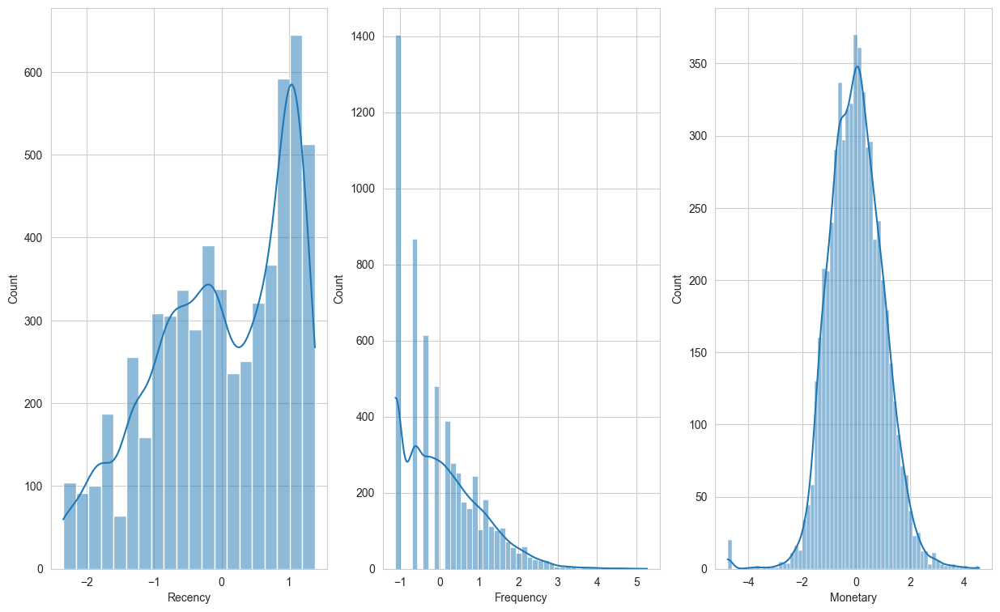

In [41]:
fig, axes = plt.subplots(1, 3, figsize = (15, 9))
for ax in axes:
    ax.set_ylabel('Count')

sns.histplot(handler.rfm_scaled['Recency'], kde=True, ax=axes[0])
sns.histplot(handler.rfm_scaled['Frequency'], kde=True, ax=axes[1])
axes[1].set_xlabel('Frequency')
sns.histplot(handler.rfm_scaled['Monetary'], kde=True, ax=axes[2])
axes[2].set_xlabel('Monetary')

### Customer RFM Segments from Score

In [42]:
handler.rfm

,Customer ID,DateOfLastPurchase,Recency,Frequency,Monetary,R,F,M,RFM_Score
0,12347.0,2011-12-07 15:52:00,2,8,5633.32,1,3,4,134
1,12348.0,2011-09-25 13:13:00,75,5,2019.40,2,3,3,233
2,12349.0,2011-11-21 09:51:00,19,5,4404.54,1,3,4,134
3,12350.0,2011-02-02 16:01:00,310,1,334.40,3,1,2,312
4,12351.0,2010-11-29 15:23:00,375,1,300.93,3,1,1,311
...,...,...,...,...,...,...,...,...,...
5852,18283.0,2011-12-06 12:02:00,4,22,2736.65,1,4,4,144
5853,18284.0,2010-10-06 12:31:00,430,2,436.68,4,1,2,412
5854,18285.0,2010-02-17 10:24:00,661,1,427.00,4,1,2,412
5855,18286.0,2010-08-20 11:57:00,477,3,1188.43,4,2,3,423


In [43]:
handler.rfm_scaled

,Customer ID,DateOfLastPurchase,Recency,Frequency,Monetary,R,F,M,RFM_Score
0,12347.0,2011-12-07 15:52:00,-2.093204,0.611807,1.291840,1,3,4,134
1,12348.0,2011-09-25 13:13:00,-0.051691,0.143886,0.574431,2,3,3,233
2,12349.0,2011-11-21 09:51:00,-0.894921,0.143886,1.119750,1,3,4,134
3,12350.0,2011-02-02 16:01:00,0.838316,-1.123949,-0.681705,3,1,2,312
4,12351.0,2010-11-29 15:23:00,0.958198,-1.123949,-0.755244,3,1,1,311
...,...,...,...,...,...,...,...,...,...
5852,18283.0,2011-12-06 12:02:00,-1.770550,1.694601,0.786947,1,4,4,144
5853,18284.0,2010-10-06 12:31:00,1.044428,-0.656029,-0.495519,4,1,2,412
5854,18285.0,2010-02-17 10:24:00,1.315498,-1.123949,-0.511164,4,1,2,412
5855,18286.0,2010-08-20 11:57:00,1.109803,-0.324034,0.203814,4,2,3,423


In [44]:
handler.rfm_scaled.RFM_Score.unique()

array(['134', '233', '312', '311', '243', '313', '224', '144', '244',
       '322', '123', '321', '412', '111', '413', '423', '234', '223',
       '323', '124', '122', '324', '314', '133', '333', '222', '411',
       '212', '213', '214', '332', '334', '211', '114', '422', '344',
       '414', '112', '444', '143', '132', '432', '232', '433', '113',
       '421', '331', '343', '221', '424', '342', '434', '443', '121',
       '431', '231', '242', '142', '442', '441', '241', '131', '341'],
      dtype=object)

### Notes on RFM_Scores/Quantiles:

R, desirable for this to be low

F, desirable for this to be high

M, desirable for this to be high

In [45]:
%%html
<style>
  table {margin-left: 0 !important;}
</style>

### Proposed Qualitative Customer of Interest Groupings:

| R | F | M | Quality |
|---|---|---|---------|
| 1 | 1 | X | New Customer |
| 1 | 4 | X | High Activity |
| X | 4 | 4 | High Loyalty, High Spend |
| 1 | 4 | 4 | Prime Customer |
| 3 | 4 | 4 | Moderate Recency, High Frequency, High Spend |
| 4 | X | 4 | High Value, Inactive |
| 4 | 4 | X | High Loyalty, Inactive |
| 4 | (4, 3) | (4, 3) | High Loyalty, High Spend, Inactive |
| > 2 | <= 2 | <= 2 | Potential Churn |

Breaking into different interest segments:


**Loyal Customers of Interest**:
- Prime Customer

- High Activity

- High Loyalty, High Spend


**At-Risk Customers of Interest**:
- Moderate Recency, High Frequency, High Spend

- High Value, Inactive

- High Loyalty, Inactive

- High Loyalty, High Spend, Inactive

- Potential Churn

Let's apply these qualitative groupings and compare their distributions in our RFM customer data

In [46]:
def RFM_Quality(df):
    # Define the conditions and corresponding quality values
    conditions = [
        ((df['R'] == 1) & (df['F'] == 1)), # New Customer
        ((df['R'] == 1) & (df['F'] == 4)), # High Activity
        ((df['F'] == 4) & (df['M'] == 4)), # High Loyalty, High Spend
        ((df['R'] == 1) & (df['F'] == 4) & (df['M'] == 4)), # Prime Customer
        ((df['R'] == 4) & (df['M'] == 4)), # High Value, Inactive
        ((df['R'] == 4) & (df['F'] == 4)), # High Loyalty, Inactive
        ((df['R'] == 4) & (df['F'] == 4) & (df['M'] == 4)),  # High Loyalty, High Spend, Inactive
        ((df['R'] == 4) & (df['F'] == 4) & (df['M'] == 3)),  # High Loyalty, High Spend, Inactive
        ((df['R'] == 4) & (df['F'] == 3) & (df['M'] == 4)),  # High Loyalty, High Spend, Inactive
        ((df['R'] == 4) & (df['F'] == 3) & (df['M'] == 3)),  # High Loyalty, High Spend, Inactive
        ((df['R'] == 3) & (df['F'] == 4) & (df['M'] == 4)),  # Moderate Recency, High Frequency, High Spend
        ((df['R'] > 2) & (df['F'] <= 2) & (df['M'] <= 2))  # Low Recency, Low Frequency, Low Spend (Potential Churn)
    ]
    
    quality_values = [
        'New Customer',
        'High Activity',
        'High Loyalty, High Spend',
        'Prime Customer',
        'High Value, Inactive', # At-Risk: High Value, Inactive
        'High Loyalty, Inactive', # At-Risk: High Loyalty, Inactive
        'High Loyalty, High Spend, Inactive',  # At-Risk: High Loyalty, High Spend, Inactive
        'High Loyalty, High Spend, Inactive',  # At-Risk: High Loyalty, High Spend, Inactive
        'High Loyalty, High Spend, Inactive',  # At-Risk: High Loyalty, High Spend, Inactive
        'High Loyalty, High Spend, Inactive',  # At-Risk: High Loyalty, High Spend, Inactive
        'Moderate Recency, High Frequency, High Spend',  # At-Risk: Moderate Recency, High Frequency, High Spend
        'Potential Churn'  # At-Risk: Potential Churn
    ]
    
    # Use np.select to apply the conditions and assign the quality values
    df['Quality'] = np.select(conditions, quality_values, default='Other')

    #repeating pattern above for at-risk
    at_risk_conditions = [
        (df['Quality'] == 'High Value, Inactive'),
        (df['Quality'] == 'High Loyalty, Inactive'),
        (df['Quality'] == 'High Loyalty, High Spend, Inactive'),
        (df['Quality'] == 'Moderate Recency, High Frequency, High Spend'),
        (df['Quality'] == 'Potential Churn'),
    ]

    at_risk_values = [
        True,
        True,
        True,
        True,
        True
    ] 

    df['At_Risk'] = np.select(at_risk_conditions, at_risk_values, default=False)

    #repeating pattern above for loyal-customer
    loyalty_conditions = [
        (df['Quality'] == 'Prime Customer'),
        (df['Quality'] == 'High Activity'),
        (df['Quality'] == 'High Loyalty, High Spend')
    ]

    loyalty_values = [
        True,
        True,
        True
    ] 

    df['Loyal_Interest'] = np.select(loyalty_conditions, loyalty_values, default=False)

    #Add Some additional quality flags
    df['Is_High_Value'] = df.apply(lambda x : True if x['M'] >= 3 else False, axis=1)
    df['Is_High_Activity'] = df.apply(lambda x : True if x['F'] >= 4 else False, axis=1)
    df['Is_Recent'] = df.apply(lambda x : True if x['R'] <= 2 else False, axis=1)
    
    # Print the updated DataFrame
    return df

#The above has been incorporated into the data handler

In [112]:
handler.rfm_quality_scaled.Quality.value_counts()/handler.rfm_quality_scaled.shape[0]

Quality
Other                                 0.418815
Potential Churn                       0.314666
High Activity                         0.126174
High Loyalty, High Spend              0.082295
New Customer                          0.037391
High Loyalty, High Spend, Inactive    0.010927
High Value, Inactive                  0.006829
High Loyalty, Inactive                0.002903
Name: count, dtype: float64

([<matplotlib.patches.Wedge at 0x1f093c36ed0>,
 [Text(0.2775230280970155, 1.0644157875923597, 'Other'),
  Text(-0.9764788914764387, -0.5064474054637319, 'Potential Churn'),
  Text(0.31728355728750585, -1.053247902573267, 'High Activity'),
  Text(0.8931673894155615, -0.6420685434473419, 'High Loyalty, High Spend'),
  Text(1.0665420284672138, -0.26923614451451566, 'New Customer'),
  Text(1.0949901880414192, -0.10486414112086859, 'High Loyalty, High Spend, Inactive'),
  Text(1.0991336031660368, -0.043649998754239715, 'High Value, Inactive'),
  Text(1.0999542701254283, -0.01003013623220692, 'High Loyalty, Inactive')])

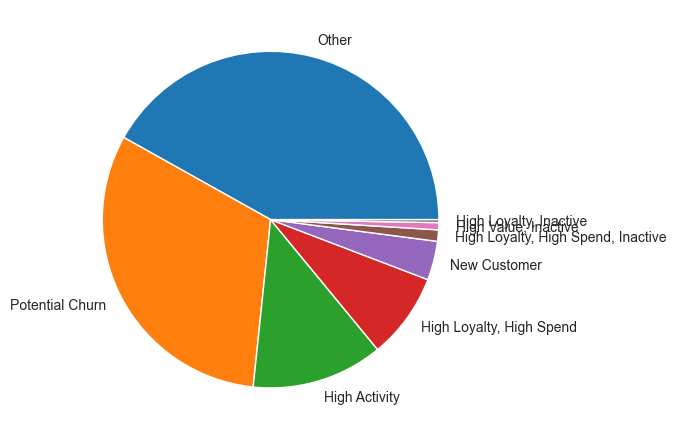

In [111]:
fig, ax = plt.subplots()
fig.tight_layout()

ax.pie(pd.DataFrame(handler.rfm_quality_scaled.Quality.value_counts()/handler.rfm_quality_scaled.shape[0]).reset_index()['count'], labels=pd.DataFrame(handler.rfm_quality_scaled.Quality.value_counts()/handler.rfm_quality_scaled.shape[0]).reset_index()['Quality'])

In [98]:
handler.rfm_quality_scaled.At_Risk.value_counts()/handler.rfm_quality_scaled.shape[0]

At_Risk
False    0.664675
True     0.335325
Name: count, dtype: float64

In [99]:
handler.rfm_quality_scaled.Loyal_Interest.value_counts()/handler.rfm_quality_scaled.shape[0]

Loyal_Interest
False    0.791532
True     0.208468
Name: count, dtype: float64

### RFM Qualitative Grouping Plots

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


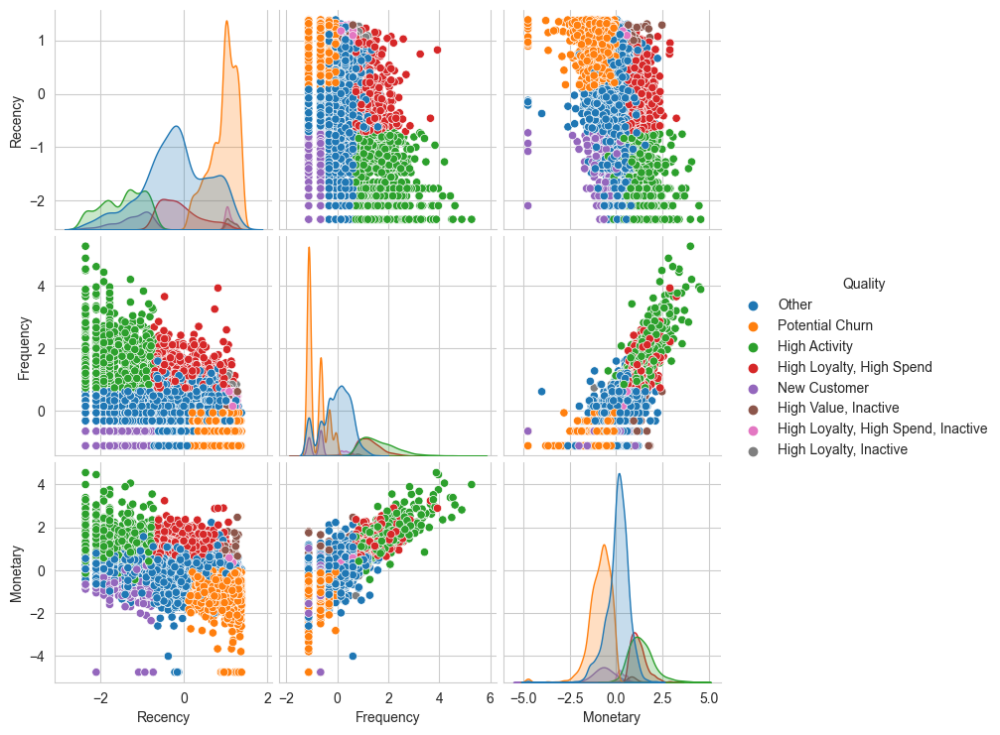

In [50]:
sns.pairplot(handler.rfm_quality_scaled, vars=['Recency', 'Frequency', 'Monetary'], hue='Quality')

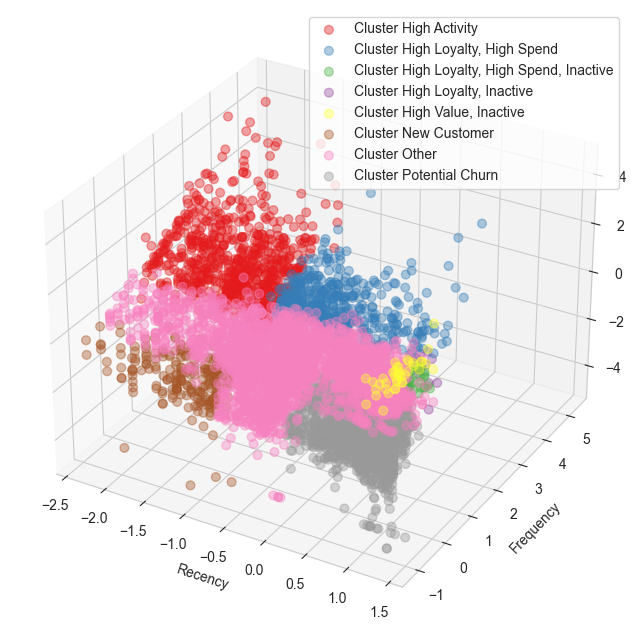

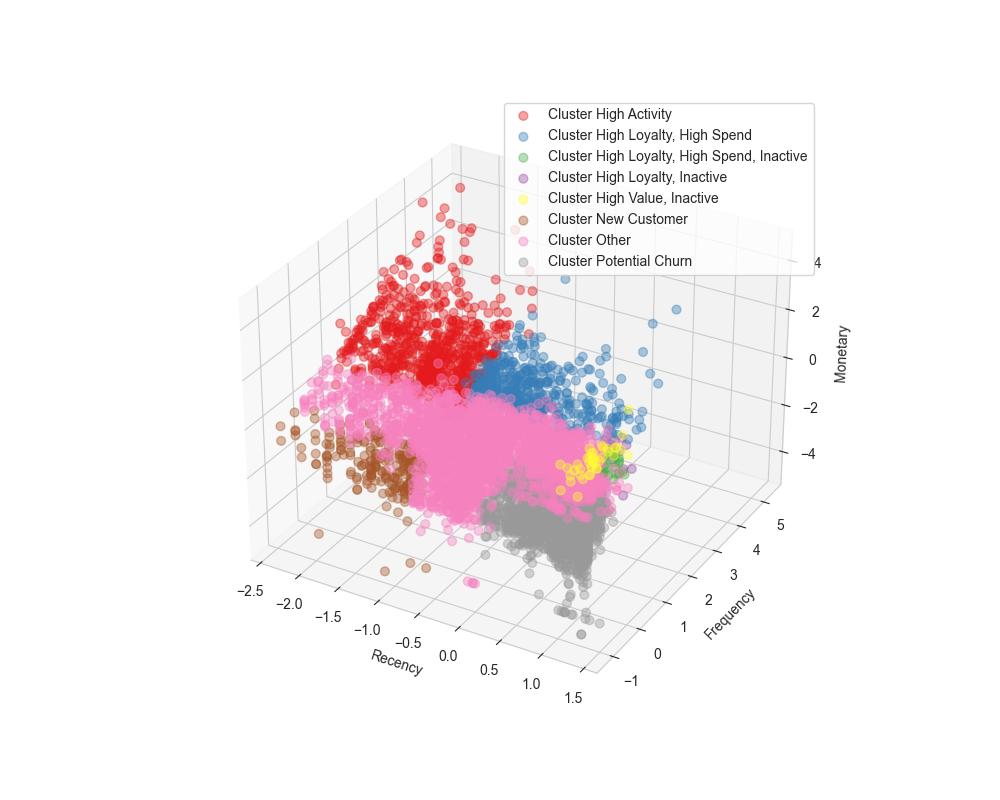

In [51]:
handler.RFM_3D_Plot(handler.rfm_quality_scaled, 'Quality')

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

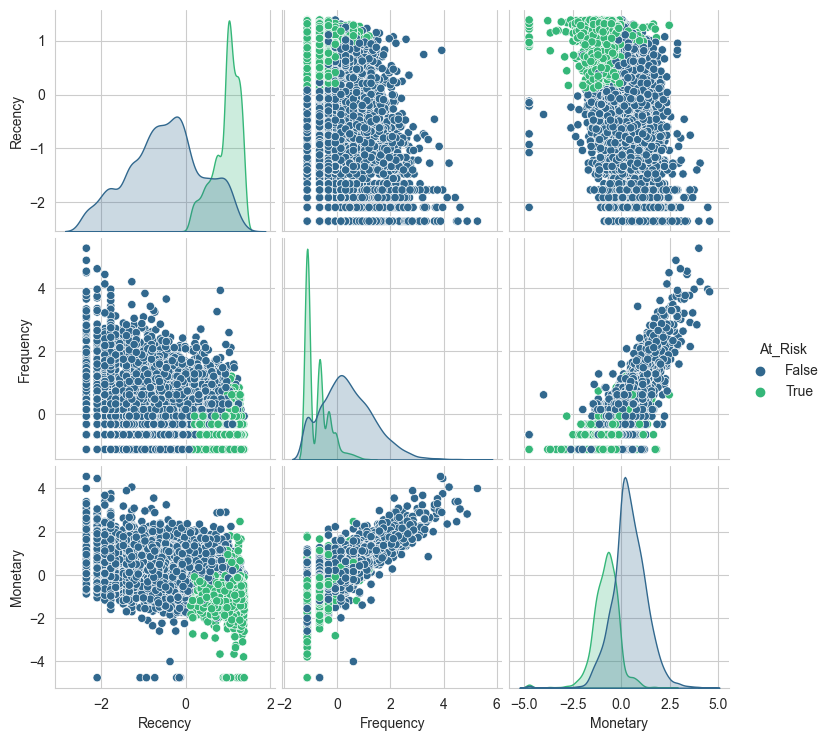

In [95]:
plt.close()
plt.clf()
%matplotlib inline

sns.pairplot(handler.rfm_quality_scaled, vars=['Recency', 'Frequency', 'Monetary'], hue='At_Risk', palette="viridis")

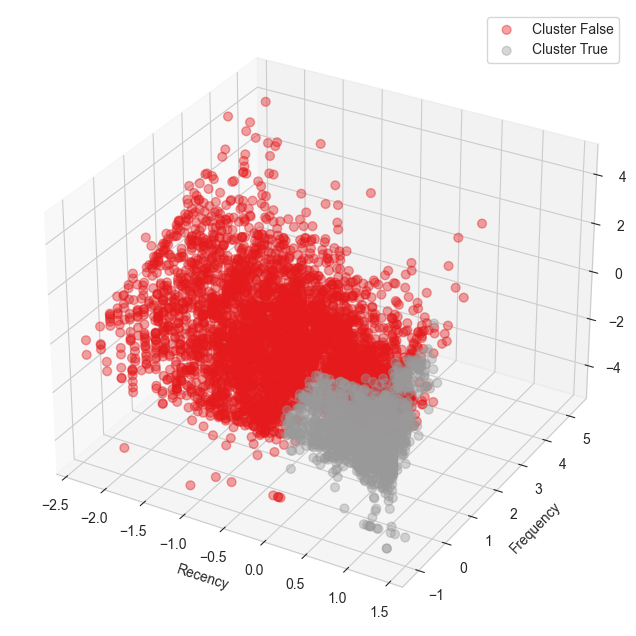

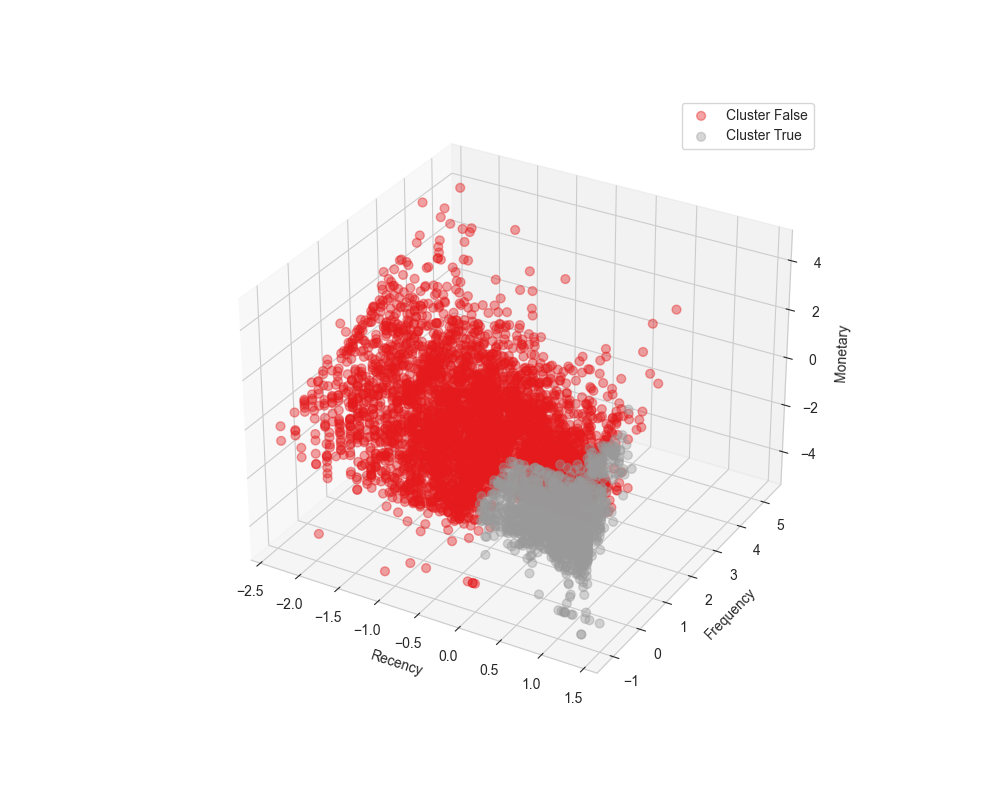

In [53]:
handler.RFM_3D_Plot(handler.rfm_quality_scaled, 'At_Risk')

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


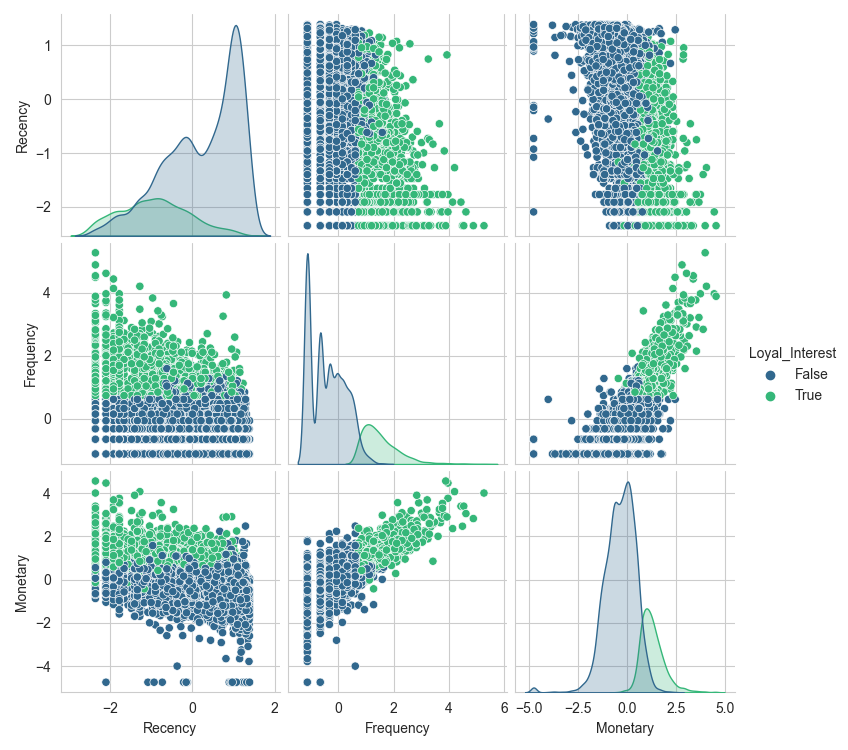

In [91]:
plt.close()

sns.pairplot(handler.rfm_quality_scaled, vars=['Recency', 'Frequency', 'Monetary'], hue='Loyal_Interest', palette="viridis")

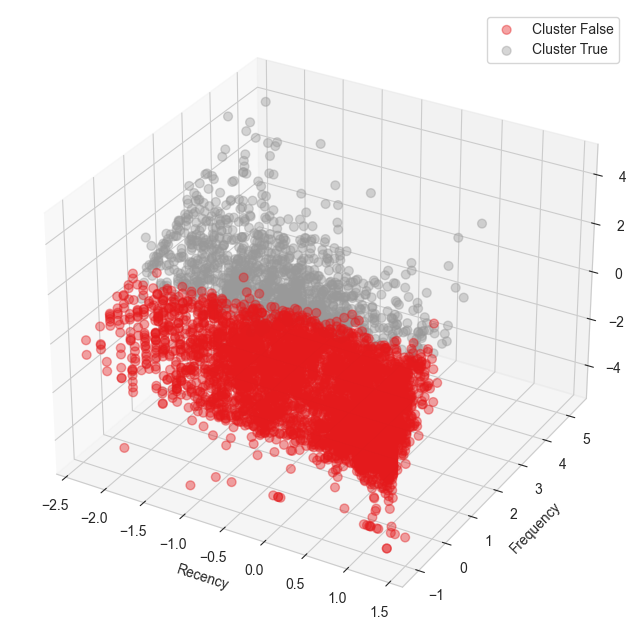

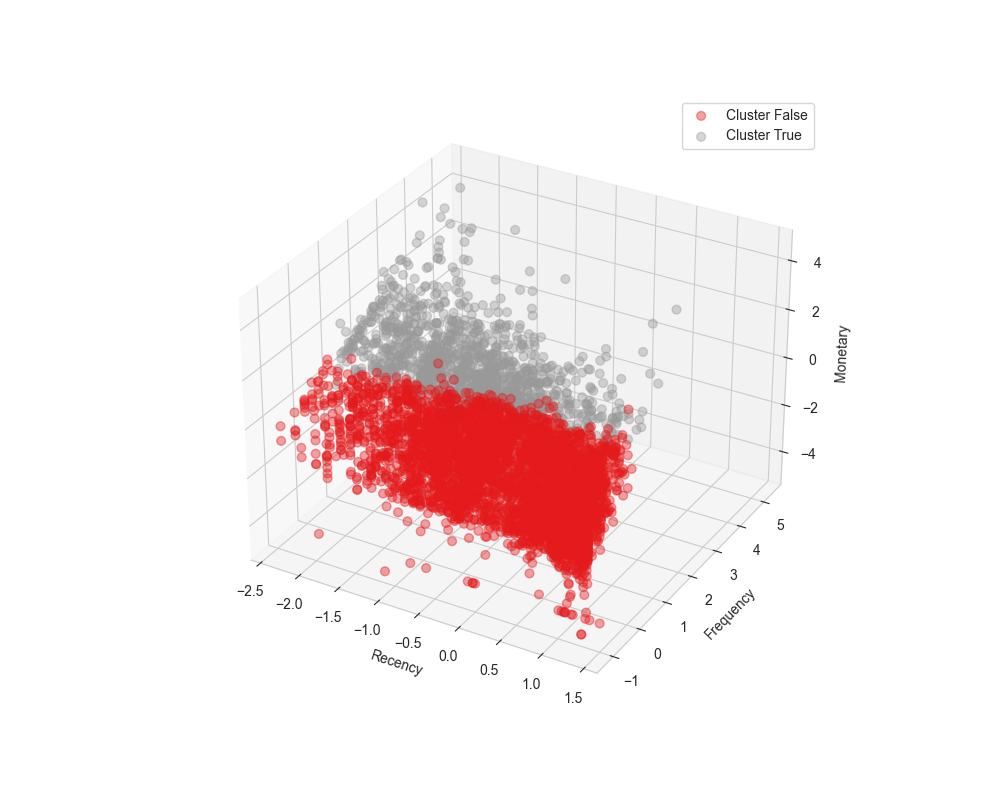

In [92]:
handler.RFM_3D_Plot(handler.rfm_quality_scaled, 'Loyal_Interest')

## Clustering/Segmentation

### KMeans

#### Elbow-Method for KMeans w/ Inertia
- for reasons unknown to me, the kernel dies if these are in a for loop or run in the same cell

##### scores set-up

In [289]:
inertias = []
silhouettes = []

# handler.cluster(type='KMeans', k=1)
# inertias.append(handler.cls_model.inertia_)

In [290]:
handler.cluster(type='KMeans', k=2)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [291]:
handler.cluster(type='KMeans', k=3)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [292]:
handler.cluster(type='KMeans', k=4)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [293]:
handler.cluster(type='KMeans', k=5)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [294]:
handler.cluster(type='KMeans', k=6)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [295]:
handler.cluster(type='KMeans', k=7)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [296]:
handler.cluster(type='KMeans', k=8)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [297]:
handler.cluster(type='KMeans', k=9)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [298]:
handler.cluster(type='KMeans', k=10)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [299]:
handler.cluster(type='KMeans', k=11)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [300]:
handler.cluster(type='KMeans', k=12)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [301]:
handler.cluster(type='KMeans', k=13)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [302]:
handler.cluster(type='KMeans', k=14)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [303]:
handler.cluster(type='KMeans', k=15)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [304]:
handler.cluster(type='KMeans', k=16)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [305]:
handler.cluster(type='KMeans', k=17)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [306]:
handler.cluster(type='KMeans', k=18)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [307]:
handler.cluster(type='KMeans', k=19)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [308]:
handler.cluster(type='KMeans', k=20)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [309]:
handler.cluster(type='KMeans', k=21)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [310]:
handler.cluster(type='KMeans', k=22)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [311]:
handler.cluster(type='KMeans', k=23)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [312]:
handler.cluster(type='KMeans', k=24)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [313]:
handler.cluster(type='KMeans', k=25)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [314]:
handler.cluster(type='KMeans', k=26)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [315]:
handler.cluster(type='KMeans', k=27)
inertias.append(handler.cls_model.inertia_)
silhouettes.append(silhouette_score(handler.rfm_scaled[['Recency', 'Frequency', 'Monetary']], handler.rfm_KM_cluster.Cluster))

rfm_cluster created 
cls_model created


In [316]:
dump(inertias, 'inertias.gz')
dump(silhouettes, 'silhouettes.gz')

['silhouettes.gz']

#### Inertia Elbow-Plot

In [618]:
inertias = load('inertias.gz')
silhouettes = load('silhouettes.gz')

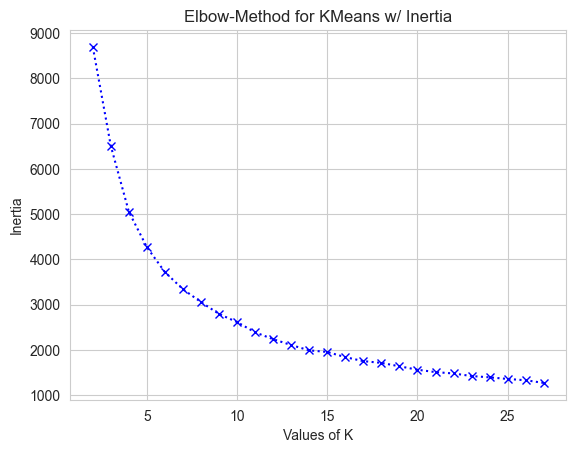

In [76]:
plt.close()
%matplotlib inline

plt.plot(range(2, 28), inertias, 'x:b')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('Elbow-Method for KMeans w/ Inertia')
plt.show()

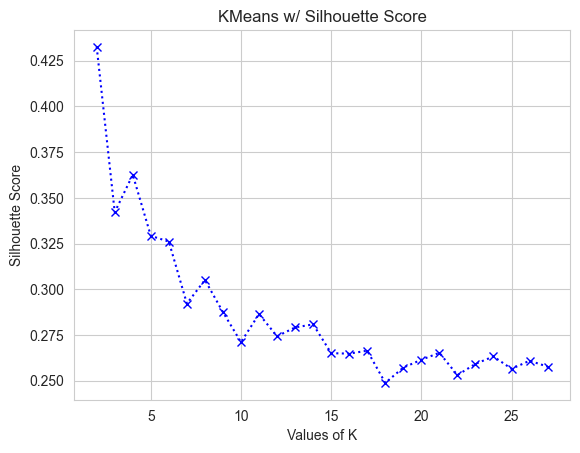

In [78]:
plt.close()
%matplotlib inline

#Silhouette Scores (higher is better)
plt.plot(range(2, 28), silhouettes, 'x:b')
plt.xlabel('Values of K')
plt.ylabel('Silhouette Score')
plt.title('KMeans w/ Silhouette Score')
plt.show()

From the above, it looks like K=4 or K=8 is an appropriate number of clusters for minimizing inertia while keeping K low

We will choose K=8

In [619]:
handler.cluster(type='KMeans', k=8)
handler.rfm_KM_cluster

rfm_cluster created 
cls_model created


,Customer ID,DateOfLastPurchase,Recency,Frequency,Monetary,R,F,M,RFM_Score,Cluster
0,12347.0,2011-12-07 15:52:00,-2.093204,0.611807,1.291840,1,3,4,134,4
1,12348.0,2011-09-25 13:13:00,-0.051691,0.143886,0.574431,2,3,3,233,3
2,12349.0,2011-11-21 09:51:00,-0.894921,0.143886,1.119750,1,3,4,134,4
3,12350.0,2011-02-02 16:01:00,0.838316,-1.123949,-0.681705,3,1,2,312,7
4,12351.0,2010-11-29 15:23:00,0.958198,-1.123949,-0.755244,3,1,1,311,7
...,...,...,...,...,...,...,...,...,...,...
5852,18283.0,2011-12-06 12:02:00,-1.770550,1.694601,0.786947,1,4,4,144,2
5853,18284.0,2010-10-06 12:31:00,1.044428,-0.656029,-0.495519,4,1,2,412,6
5854,18285.0,2010-02-17 10:24:00,1.315498,-1.123949,-0.511164,4,1,2,412,7
5855,18286.0,2010-08-20 11:57:00,1.109803,-0.324034,0.203814,4,2,3,423,6


C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


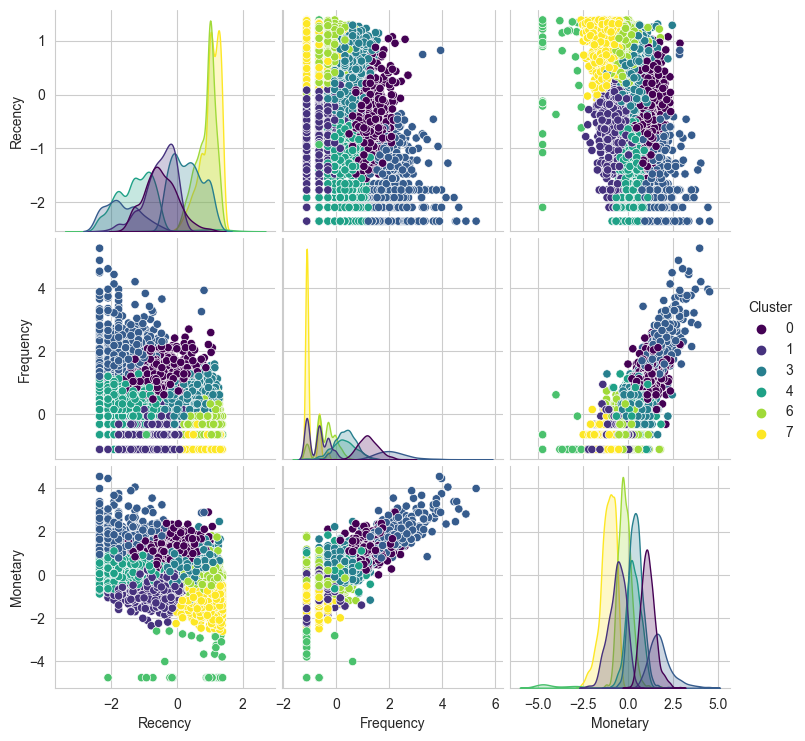

In [79]:
sns.pairplot(handler.rfm_KM_cluster, vars=['Recency', 'Frequency', 'Monetary'], hue='Cluster', palette="viridis")

Recency and Monetary axes provide the best separation between clusters, with cluster 3 showing notable separation in high monetary, high frequency separation from other clusters

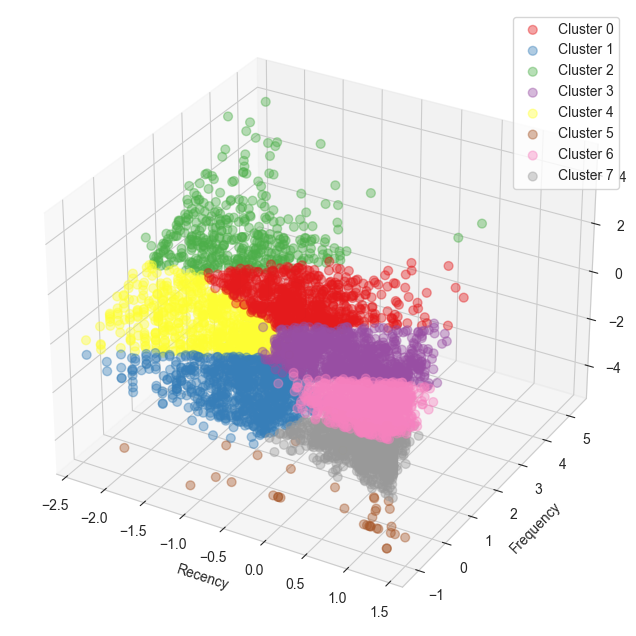

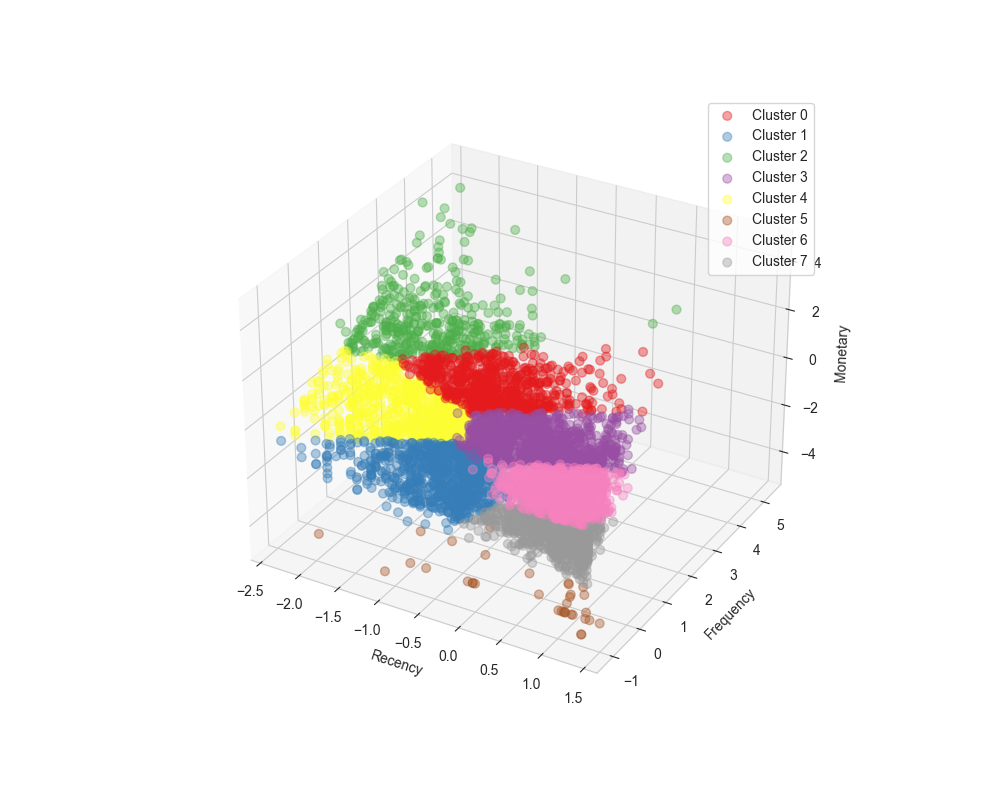

In [62]:
handler.RFM_3D_Plot(handler.rfm_KM_cluster)

In [63]:
KM_centers = pd.DataFrame(handler.cls_model.cluster_centers_, columns=['Recency', 'Frequency', 'Monetary'])
KM_centers
#Low Recency is good (shorter time since last purchase)
#High Frequency is good
#High Monetary is good

,Recency,Frequency,Monetary
0,-0.506127,1.204227,1.114317
1,-0.514971,-0.711199,-0.605543
2,-1.631363,2.159662,1.787927
3,0.314718,0.371510,0.438440
4,-1.292067,0.258429,0.307573
5,0.534003,-0.816868,-4.054616
6,0.872768,-0.426846,-0.179371
7,1.011570,-1.013329,-1.108458


#### KMeans Notes

**Assumptions from plot:**

| Cluster | Cluster Description | Customer Description |
|---------|---------------------|----------------------|
|    0    | Active, High Frequency, High Spend | At-Risk: Inactive Prime Customer |
|    1    | Active, Low Frequency, Low Spend | New Customer |
|    2    | Very Active, Highest Frequency, Highest Spend | Prime Customer |
|    3    | Moderately Inactive, Moderate in all categories | At-Risk: Inactive Normative Customer |
|    4    | Very Active, Moderate Frequency, Moderate Spend | Active Normative Customer |
|    5    | Moderate Inactivity, Low Frequency, Lowest Spend | At-Risk: Churned New Customers |
|    6    | Inactive, Low Frequency, Normal Spend | At-Risk: Likely-to-Churn Normative Customer |
|    7    | Inactive, Lowest Frequency, Low Spend| At-Risk: Churned Customers |

### DBSCAN

In [64]:
handler.cluster(type='DBSCAN')
handler.rfm_DBSCAN_cluster

rfm_cluster created 
cls_model created


,Customer ID,DateOfLastPurchase,Recency,Frequency,Monetary,R,F,M,RFM_Score,Cluster
0,12347.0,2011-12-07 15:52:00,-2.093204,0.611807,1.291840,1,3,4,134,0
1,12348.0,2011-09-25 13:13:00,-0.051691,0.143886,0.574431,2,3,3,233,0
2,12349.0,2011-11-21 09:51:00,-0.894921,0.143886,1.119750,1,3,4,134,0
3,12350.0,2011-02-02 16:01:00,0.838316,-1.123949,-0.681705,3,1,2,312,0
4,12351.0,2010-11-29 15:23:00,0.958198,-1.123949,-0.755244,3,1,1,311,0
...,...,...,...,...,...,...,...,...,...,...
5852,18283.0,2011-12-06 12:02:00,-1.770550,1.694601,0.786947,1,4,4,144,0
5853,18284.0,2010-10-06 12:31:00,1.044428,-0.656029,-0.495519,4,1,2,412,0
5854,18285.0,2010-02-17 10:24:00,1.315498,-1.123949,-0.511164,4,1,2,412,0
5855,18286.0,2010-08-20 11:57:00,1.109803,-0.324034,0.203814,4,2,3,423,0


In [65]:
handler.rfm_DBSCAN_cluster.Cluster.value_counts()

Cluster
 0    5787
-1      58
 1      12
Name: count, dtype: int64

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


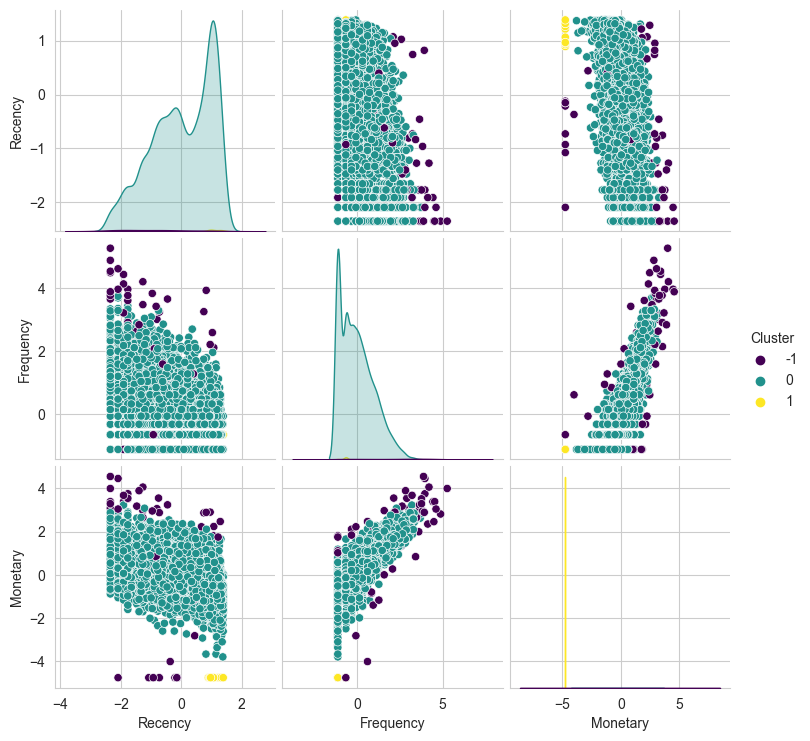

In [97]:
sns.pairplot(handler.rfm_DBSCAN_cluster, vars=['Recency', 'Frequency', 'Monetary'], hue='Cluster', palette="viridis")

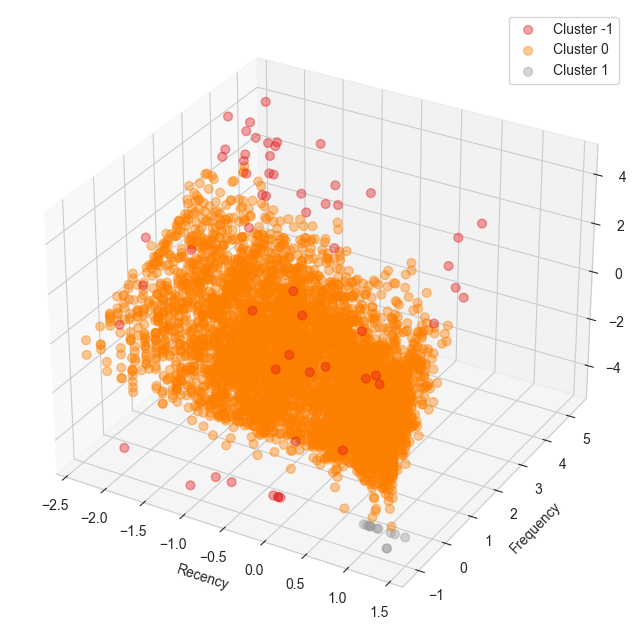

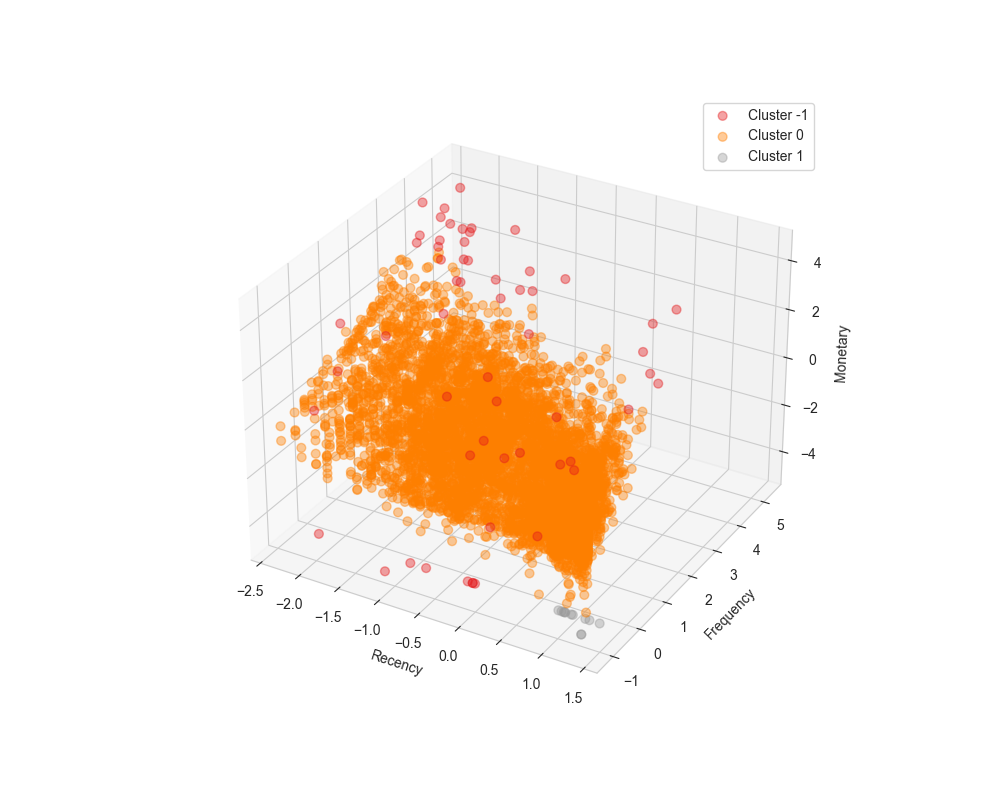

In [80]:
handler.RFM_3D_Plot(handler.rfm_DBSCAN_cluster)

#### DBSCAN Notes:

DBSCAN clusters appear to have poor separation, mainly identifying outlier behavior as the points outside of a rough plane in the 3D space

Clusters 1 and -1 are outlier clusters

Cluster -1 : Low spend, infrequent, inactive (Churned Low-Interaction Customers)

Cluster 0 : Normative consumer behavior 

Cluster 1 : Customers outside of the plane of Cluster 0 based primarily on Monetary axis (both high and low, Prime Value customers and At-Risk Customers in this cluster but not exclusively)

Seems poorly suited for anything other than identifying extreme outliers in this case

### Birch Clustering

In [88]:
B_cls_model = Birch(n_clusters=8)
B_labels = B_cls_model.fit_predict(handler.rfm_scaled[value_cols])
np.unique(B_labels).shape

(8,)

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


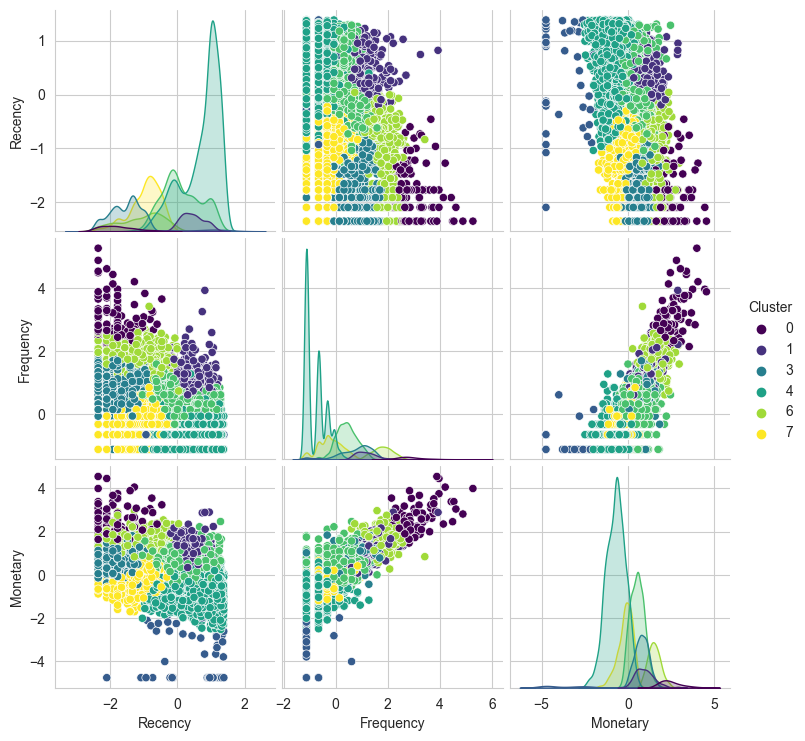

In [96]:
plt.close()
%matplotlib inline

sns.pairplot(handler.rfm_scaled.join(pd.DataFrame(B_labels)).rename(columns={0:'Cluster'}), vars=['Recency', 'Frequency', 'Monetary'], hue='Cluster', palette="viridis")

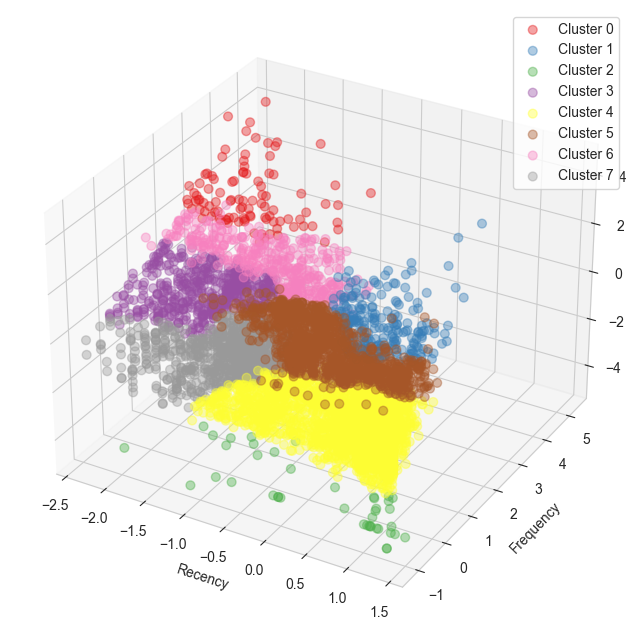

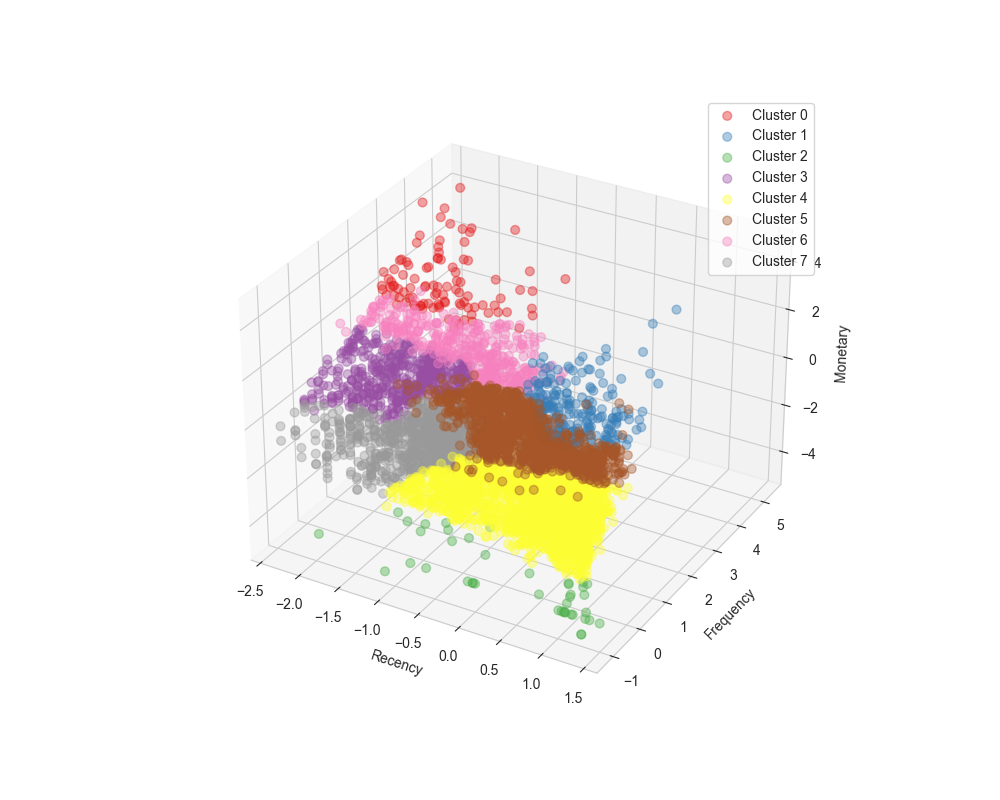

In [116]:
if np.unique(B_labels).shape[0] < 25: 
    handler.RFM_3D_Plot(handler.rfm_scaled.join(pd.DataFrame(B_labels)).rename(columns={0:'Cluster'}))
else:
    pass

#### Birch Notes

**Assumptions from plot:**

| Cluster | Cluster Description | Customer Description |
|---------|---------------------|----------------------|
|    0    | Very Active, High Frequency, High Spend | Prime Customer |
|    1    | Inactive, High Frequency, High Spend | At-Risk: Inactive Prime Customer |
|    2    | Moderate Inactivity, Low Frequency, Lowest Spend | At-Risk: Inactive New Customers |
|    3    | Very Active, Moderate Frequency, Moderate Spend | Active Normative Customer |
|    4    | Inactive, Low Frequency, Low Spend | At-Risk: Likely to Churn Customer |
|    5    | Moderate Inactivity, Low Frequency, Moderate Spend | At-Risk: Inactive Normative Customer |
|    6    | Active, Moderate Frequency, High-Moderate Spend | Active Sub-Prime Customer |
|    7    | Active, Low Frequency, Low Spend| Active New Customers |

Birch clustering has produced clusters with distinct separation, with what looks to be better segmentation over the Recency axis compared to KMeans

At-Risk segments likely to give better targeting based on customer spend than KMeans clusters.

### Cluster Analysis

#### RFM Qualitative Grouping

In [457]:
handler.rfm_quality.columns

Index(['Customer ID', 'DateOfLastPurchase', 'Recency', 'Frequency', 'Monetary',
       'R', 'F', 'M', 'RFM_Score', 'Quality', 'At_Risk', 'Loyal_Interest',
       'Is_High_Value', 'Is_High_Activity', 'Is_Recent'],
      dtype='object')

In [486]:
rfm_data = handler.rfm_quality
rfm_data.Quality = rfm_data.Quality.replace({'Other' : 'Normative Customer'})

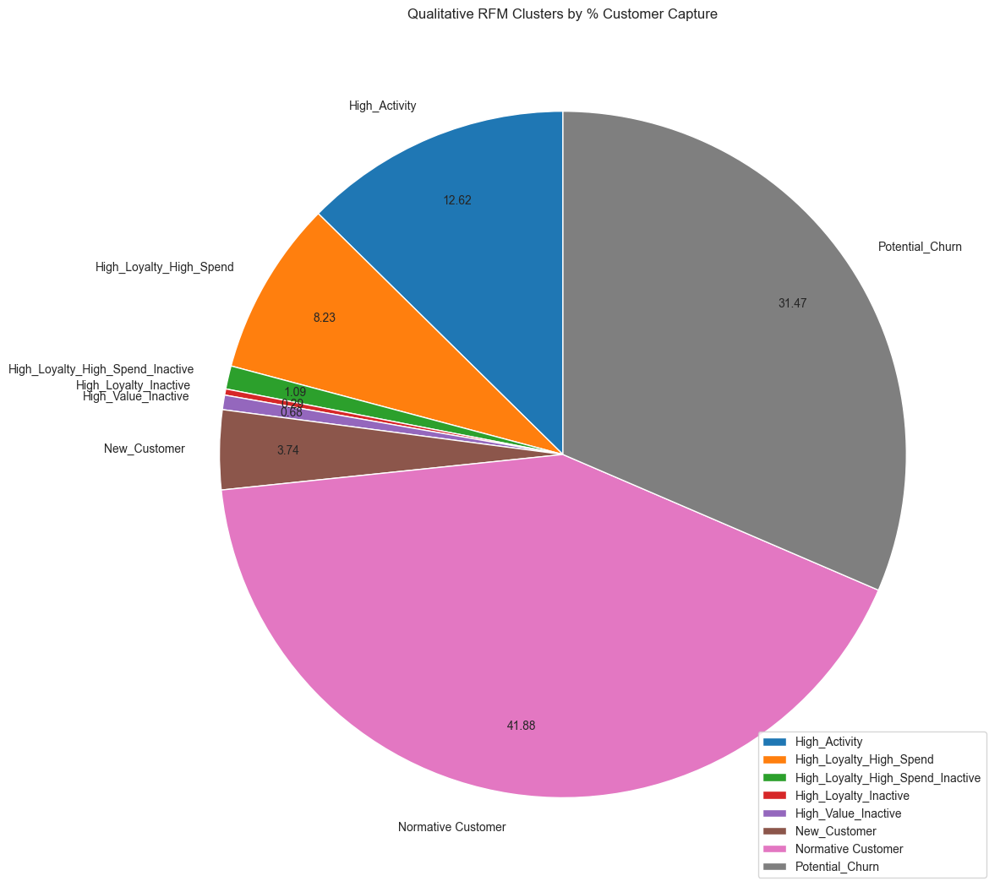

In [487]:
plt.clf()
plt.close()
%matplotlib inline
rfm_summary = pd.DataFrame(rfm_data.groupby('Quality')['Customer ID'].count()).reset_index()

plt.figure(figsize=(12, 15))
plt.pie(rfm_summary['Customer ID'], labels=rfm_summary.Quality, autopct="%.2f", pctdistance = 0.8, startangle=90)
plt.title('Qualitative RFM Clusters by % Customer Capture')
plt.legend(loc='lower right')
plt.tight_layout()

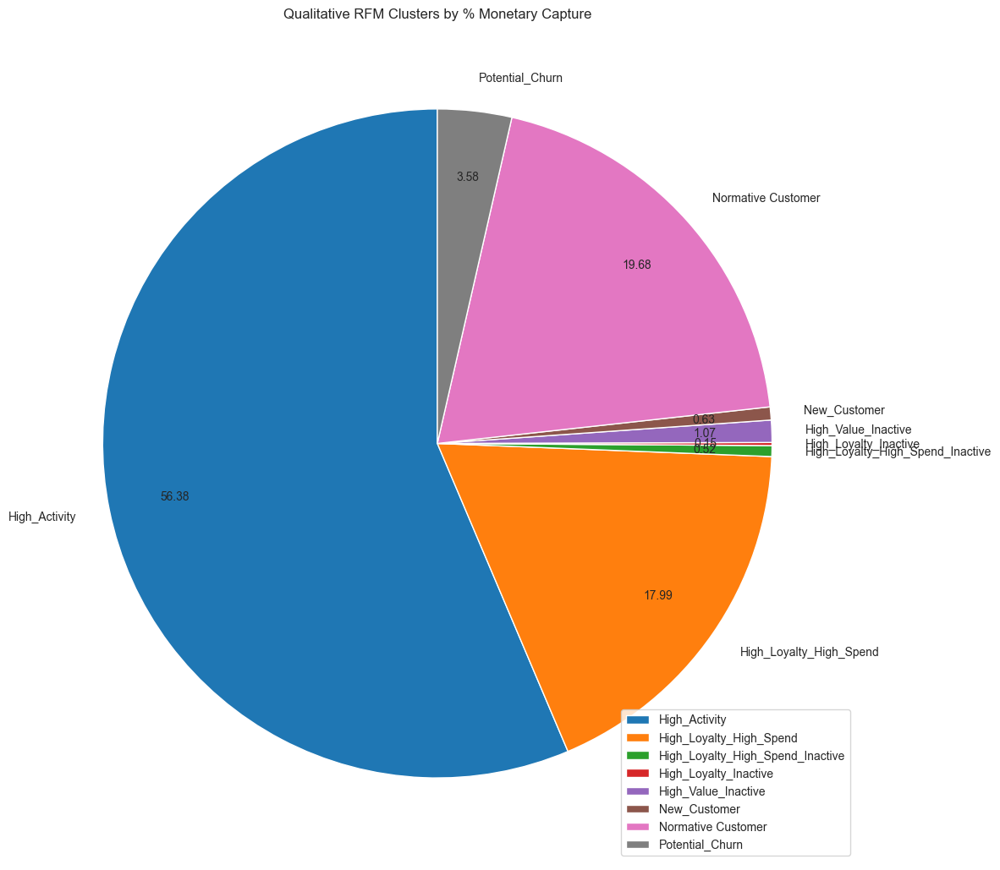

In [488]:
plt.clf()
plt.close()
%matplotlib inline
rfm_summary = pd.DataFrame(rfm_data.groupby('Quality')['Monetary'].sum()).reset_index()

plt.figure(figsize=(12, 15))
plt.pie(rfm_summary['Monetary'], labels=rfm_summary['Quality'], autopct="%.2f", pctdistance = 0.8, startangle=90)
plt.title('Qualitative RFM Clusters by % Monetary Capture')
plt.legend(loc='lower right')
plt.tight_layout()

#### KMeans

In [437]:
handler.cluster(type='KMeans', k=8)

rfm_cluster created 
cls_model created


In [438]:
KM_data = pd.concat([handler.rfm, handler.rfm_KM_cluster.Cluster], axis=1)

##### Customer & Retail Activity Capture

In [439]:
KM_Mask = {
    0	:	'At-Risk: Inactive Prime Customer',
    1	:	'New Customer',
    2	:	'Prime Customer',
    3	:	'At-Risk: Inactive Normative Customer',
    4	:	'Active Normative Customer',
    5	:	'At-Risk: Churned New Customers',
    6	:	'At-Risk: Likely-to-Churn Normative Customer',
    7	:	'At-Risk: Churned Customers'
}

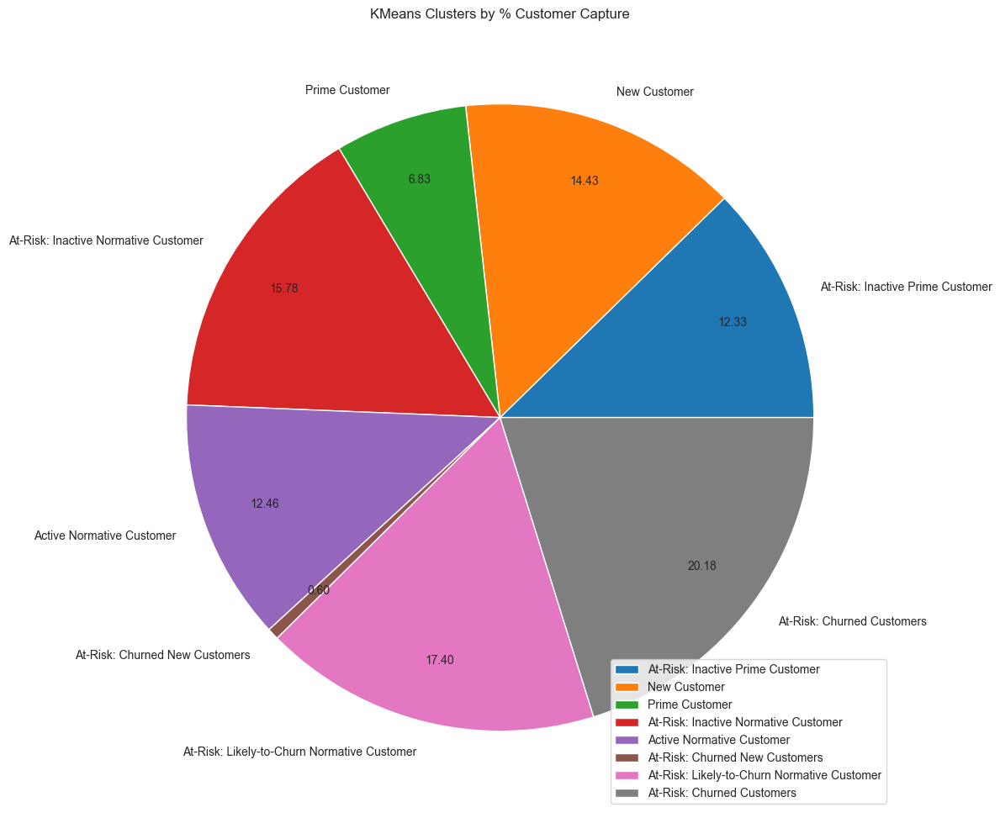

In [482]:
plt.clf()
plt.close()
%matplotlib inline

KM_summary = pd.DataFrame(KM_data.groupby('Cluster')['Customer ID'].count()).reset_index()
KM_summary.Cluster = KM_summary.Cluster.map(KM_Mask)

plt.figure(figsize=(12, 15))
plt.pie(KM_summary['Customer ID'], labels=KM_summary.Cluster, autopct="%.2f", pctdistance = 0.8)
plt.title('KMeans Clusters by % Customer Capture')
plt.legend(loc='lower right')
plt.tight_layout()

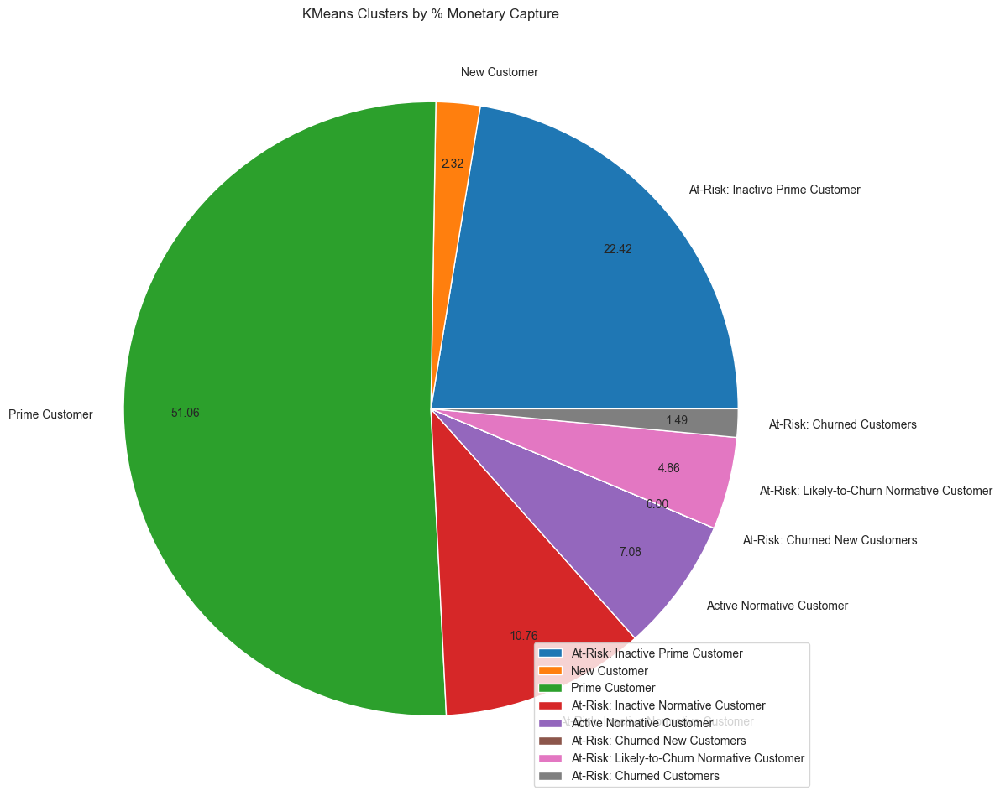

In [483]:
plt.clf()
plt.close()
%matplotlib inline
KM_summary = pd.DataFrame(KM_data.groupby('Cluster')['Monetary'].sum()).reset_index()
KM_summary.Cluster = KM_summary.Cluster.map(KM_Mask)

plt.figure(figsize=(12, 15))
plt.pie(KM_summary.Monetary, labels=KM_summary.Cluster, autopct="%.2f", pctdistance = 0.8)
plt.title('KMeans Clusters by % Monetary Capture')
plt.legend(loc='lower right')
plt.tight_layout()

##### Cluster Scoring:
- Silhouette Score
- Calinski-Harabasz Score
- Davies-Bouldin Index

In [551]:
def cluster_scoring(data, labels):
    scores = {}
    
    #Silhouette (measures similarity):
    #Higher = better defined clusters
    scores['silhouette'] = silhouette_score(data, labels)

    #Calinski-Harabasz Index
    #Higher = better defined clusters
    scores['ch_score'] = calinski_harabasz_score(data, labels)
    
    #Davies-Bouldin Index (measures cluster separation):
    #lower = better separation between clusters
    scores['db_score'] = davies_bouldin_score(data, labels)

    print(
            f"Clustering Silhouette Score: {scores['silhouette']}",
            f"\nClustering Calinski-Harabasz Score: {scores['ch_score']}",
            f"\nClustering Davies-Bouldin Index: {scores['db_score']}"
         )
    return scores

In [567]:
rfm_qual_cls_scores = pd.DataFrame(cluster_scoring(handler.rfm_scaled[value_cols], handler.rfm_quality_scaled.Quality), index=['RFM_Qual']).T
rfm_qual_cls_scores

Clustering Silhouette Score: 0.12222164803303835 
Clustering Calinski-Harabasz Score: 1689.1697878938974 
Clustering Davies-Bouldin Index: 1.1259707706319615


,RFM_Qual
silhouette,0.122222
ch_score,1689.169788
db_score,1.125971


In [566]:
KM_cls_scores = pd.DataFrame(cluster_scoring(handler.rfm_scaled[value_cols], handler.rfm_KM_cluster.Cluster), index=['KMeans']).T
KM_cls_scores

Clustering Silhouette Score: 0.30509031243962215 
Clustering Calinski-Harabasz Score: 3968.2478335260384 
Clustering Davies-Bouldin Index: 0.9383764611182684


,KMeans
silhouette,0.305090
ch_score,3968.247834
db_score,0.938376


In [565]:
B_slc_scores = pd.DataFrame(cluster_scoring(handler.rfm_scaled[value_cols], B_labels), index=['BIRCH']).T
B_slc_scores

Clustering Silhouette Score: 0.27208207949932944 
Clustering Calinski-Harabasz Score: 2631.747785536339 
Clustering Davies-Bouldin Index: 1.1205673621608487


,BIRCH
silhouette,0.272082
ch_score,2631.747786
db_score,1.120567


In [568]:
rfm_qual_cls_scores.join(KM_cls_scores).join(B_slc_scores)

,RFM_Qual,KMeans,BIRCH
silhouette,0.122222,0.305090,0.272082
ch_score,1689.169788,3968.247834,2631.747786
db_score,1.125971,0.938376,1.120567


#### Birch

In [444]:
B_labels

array([3, 5, 5, ..., 4, 4, 5], dtype=int64)

In [445]:
B_data = pd.concat([handler.rfm, pd.Series(B_labels)], axis=1).rename(columns={0:'Cluster'})

##### Customer & Retail Activity Capture

In [446]:
B_Mask = {
    0	:   'Prime Customer',
    1	:	'At-Risk: Inactive Prime Customer',
    2	:	'At-Risk: Inactive New Customers',
    3	:	'Normative Customer',
    4	:	'At-Risk: Likely to Churn Customer',
    5	:	'At-Risk: Inactive Normative Customer',
    6	:	'Sub-Prime Customer',
    7	:	'New Customers'
}

In [447]:
B_summary = pd.DataFrame(B_data.groupby('Cluster')['Customer ID'].sum()).reset_index()
B_summary.Cluster = B_summary.Cluster.map(B_Mask)

In [448]:
B_summary

,Cluster,Customer ID
0,Prime Customer,1534804.0
1,At-Risk: Inactive Prime Customer,3724285.0
2,At-Risk: Inactive New Customers,688848.0
3,Normative Customer,8008160.0
4,At-Risk: Likely to Churn Customer,39832514.0
5,At-Risk: Inactive Normative Customer,17646089.0
6,Sub-Prime Customer,6108197.0
7,New Customers,12169841.0


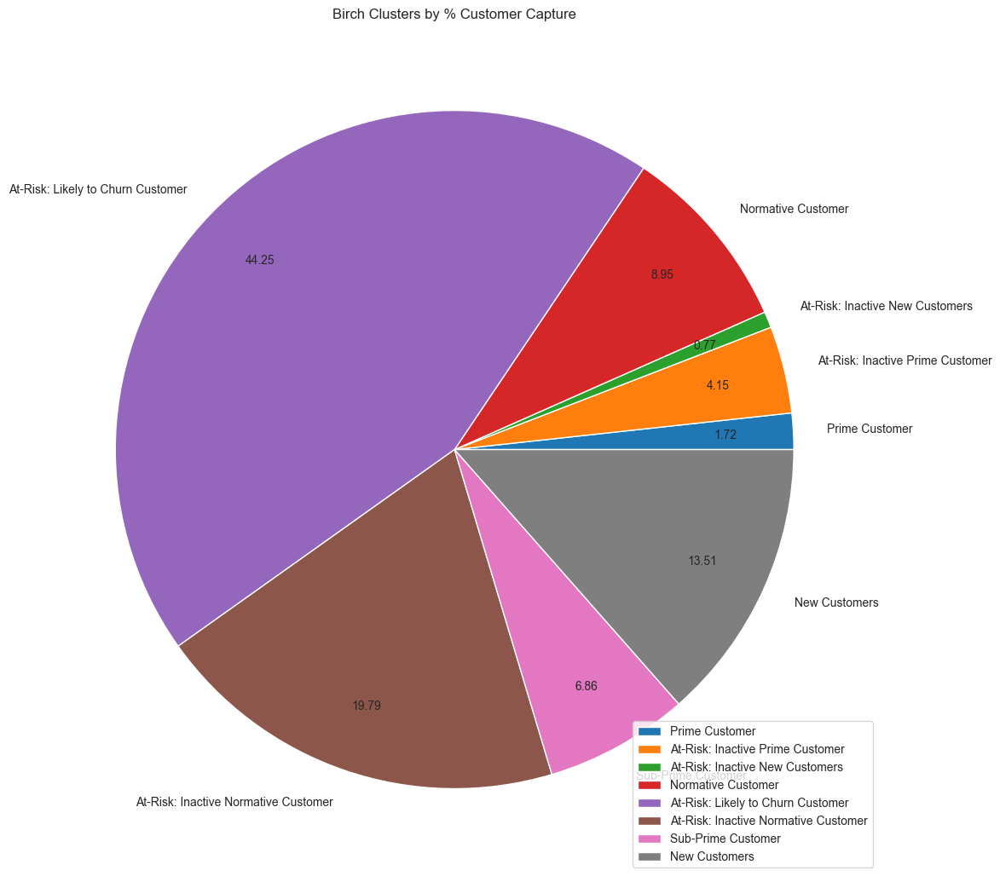

In [484]:
plt.clf()
plt.close()
%matplotlib inline
B_summary = pd.DataFrame(B_data.groupby('Cluster')['Customer ID'].count()).reset_index()
B_summary.Cluster = B_summary.Cluster.map(B_Mask)

plt.figure(figsize=(12, 15))
plt.pie(B_summary['Customer ID'], labels=B_summary.Cluster, autopct="%.2f", pctdistance = 0.8)
plt.title('Birch Clusters by % Customer Capture')
plt.legend(loc='lower right')
plt.tight_layout()

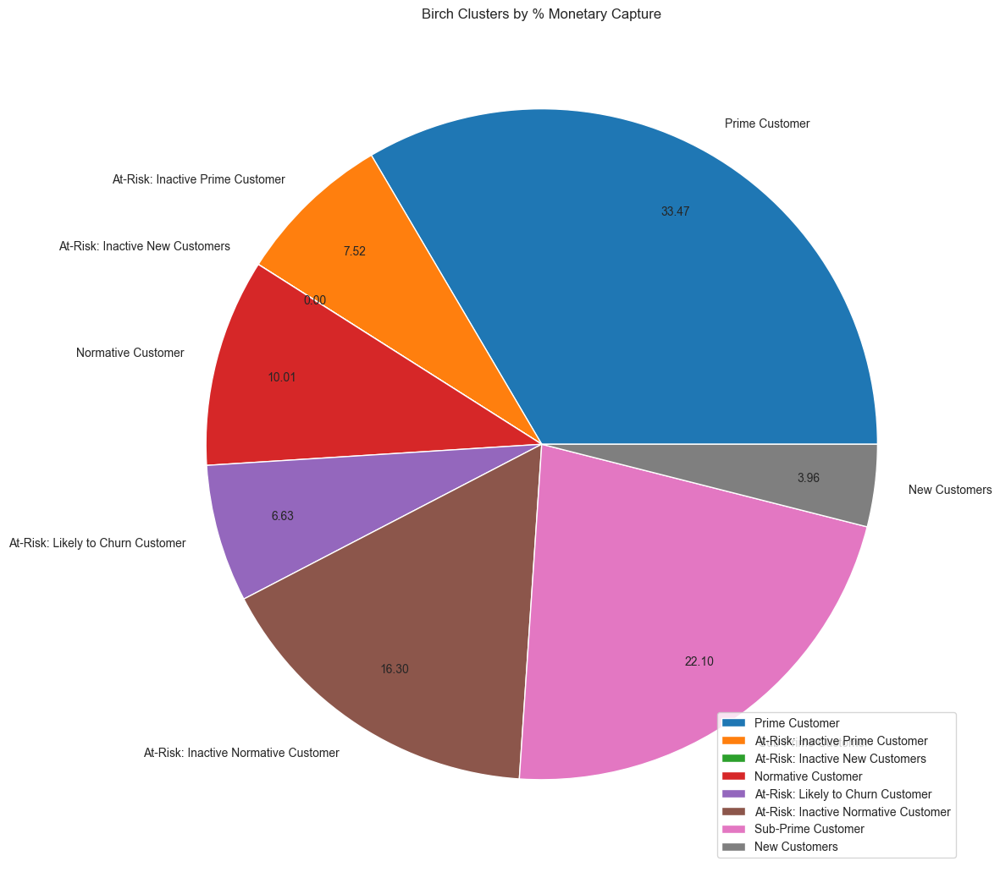

In [485]:
plt.clf()
plt.close()
%matplotlib inline
B_summary = pd.DataFrame(B_data.groupby('Cluster')['Monetary'].sum()).reset_index()
B_summary.Cluster = B_summary.Cluster.map(B_Mask)

plt.figure(figsize=(12, 15))
plt.pie(B_summary['Monetary'], labels=B_summary['Cluster'], autopct="%.2f", pctdistance = 0.8)
plt.title('Birch Clusters by % Monetary Capture')
plt.legend(loc='lower right')
plt.tight_layout()

##### Cluster Scoring:
- Silhouette Score
- Calinski-Harabasz Score
- Davies-Bouldin Index

In [554]:
cluster_scoring(handler.rfm_scaled[value_cols], B_labels)

Clustering Silhouette Score: 0.27208207949932944 
Clustering Calinski-Harabasz Score: 2631.747785536339 
Clustering Davies-Bouldin Index: 1.1205673621608487


{'silhouette': 0.27208207949932944,
 'ch_score': 2631.747785536339,
 'db_score': 1.1205673621608487}

## Predictive Modeling

### Churning EDA

In [631]:
def add_churn(df, churn_limit=90):
    MAX_DAYS_SINCE_LAST_PURCHASE = churn_limit
    current_date = df['DateOfLastPurchase'].max()
    df['Churn'] = ((current_date - df['DateOfLastPurchase']).dt.days > MAX_DAYS_SINCE_LAST_PURCHASE).astype(int)
    df = df.astype({'Customer ID' : int, 'Recency': int, 'Frequency' : int, 'Monetary' : float, 'RFM_Score' : int})
    return df

In [632]:
handler.rfm_quality_scaled = add_churn(handler.rfm_quality_scaled)
KM_data_quality_scaled = add_churn(KM_data_quality_scaled)
B_data_quality_scaled = add_churn(B_data_quality_scaled)

In [625]:
handler.rfm_quality_scaled[handler.rfm_quality_scaled['Churn'] == 1].Quality.value_counts()

Quality
Potential_Churn                     1843
Other                                824
High_Loyalty_High_Spend              149
High_Loyalty_High_Spend_Inactive      64
High_Value_Inactive                   40
High_Loyalty_Inactive                 17
Name: count, dtype: int64

In [587]:
plt.close()
plt.cla()
plt.clf()
%matplotlib inline

<Figure size 640x480 with 0 Axes>

In [626]:
handler.rfm_quality_scaled[handler.rfm_quality_scaled['Churn'] == 1].At_Risk.value_counts()

At_Risk
True     1964
False     973
Name: count, dtype: int64

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


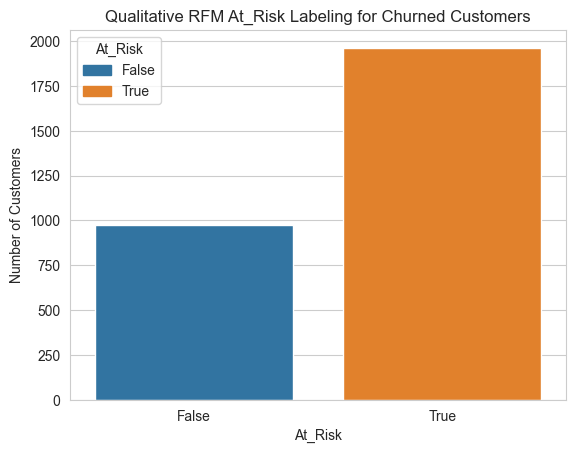

In [627]:
sns.barplot(handler.rfm_quality_scaled[handler.rfm_quality_scaled['Churn'] == 1], x='At_Risk', y= 'Customer ID', estimator= np.count_nonzero, hue='At_Risk')
plt.title('Qualitative RFM At_Risk Labeling for Churned Customers')
plt.ylabel('Number of Customers')
plt.show()

In [628]:
handler.rfm_quality_scaled[(handler.rfm_quality_scaled['Churn'] == 1) & (handler.rfm_quality_scaled['At_Risk'] == False)].Quality.value_counts()

Quality
Other                      824
High_Loyalty_High_Spend    149
Name: count, dtype: int64

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


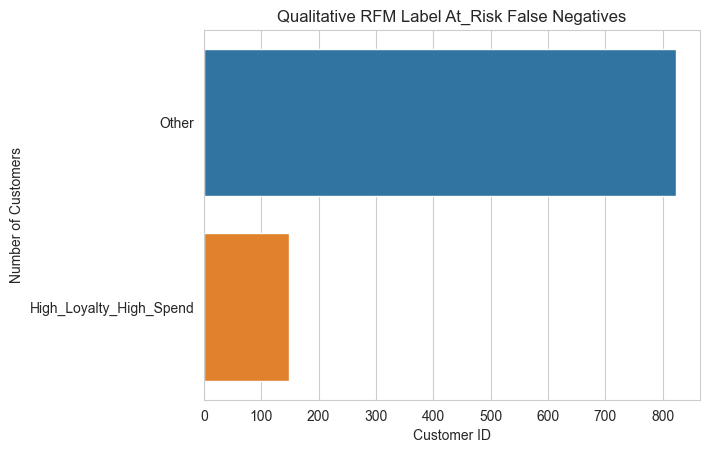

In [637]:
sns.barplot(handler.rfm_quality_scaled[(handler.rfm_quality_scaled['Churn'] == 1) & (handler.rfm_quality_scaled['At_Risk'] == False)], x='Customer ID', y= 'Quality', estimator= np.count_nonzero, hue='Quality')
plt.title('Qualitative RFM Label At_Risk False Negatives')
plt.ylabel('Number of Customers')
plt.show()

In [546]:
KM_data_quality_scaled[KM_data_quality_scaled['Churn'] == 1].Quality.value_counts()

Quality
Churned_Customers                     1177
Likely-to-Churn_Normative_Customer    1017
Inactive_Normative_Customer            589
Inactive_Prime_Customer                 83
New_Customer                            45
Churned_New_Customers                   24
Prime_Customer                           2
Name: count, dtype: int64

In [571]:
KM_data_quality_scaled[KM_data_quality_scaled['Churn'] == 1].At_Risk.value_counts()

At_Risk
True     2890
False      47
Name: count, dtype: int64

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


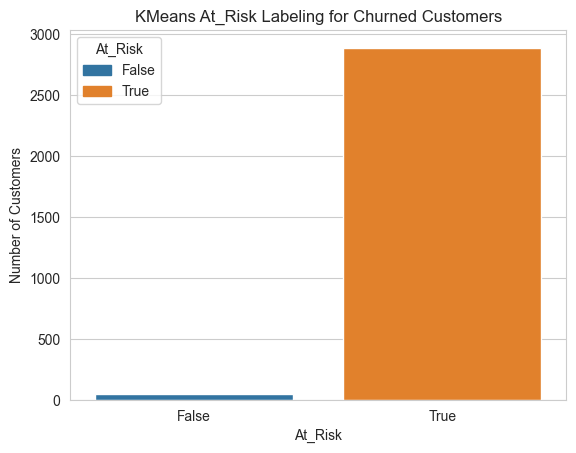

In [633]:
sns.barplot(KM_data_quality_scaled[KM_data_quality_scaled['Churn'] == 1], x='At_Risk', y= 'Customer ID', estimator= np.count_nonzero, hue='At_Risk')
plt.title('KMeans At_Risk Labeling for Churned Customers')
plt.ylabel('Number of Customers')
plt.show()

In [541]:
KM_data_quality_scaled[(KM_data_quality_scaled['Churn'] == 1) & (KM_data_quality_scaled['At_Risk'] == False)].Quality.value_counts()

Quality
New_Customer      45
Prime_Customer     2
Name: count, dtype: int64

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


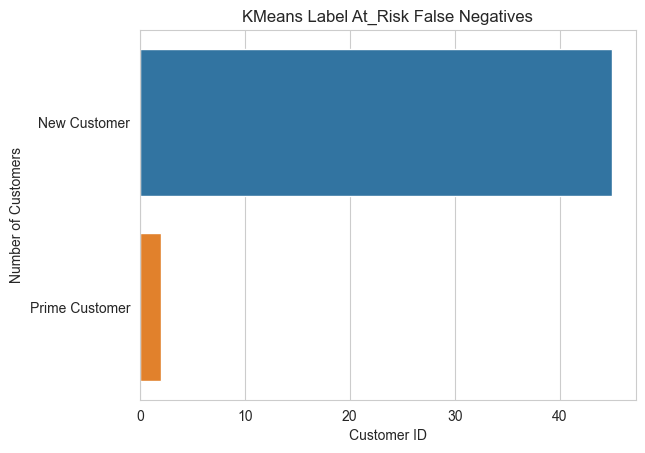

In [638]:
sns.barplot(KM_data_quality_scaled[(KM_data_quality_scaled['Churn'] == 1) & (KM_data_quality_scaled['At_Risk'] == False)], x='Customer ID', y= 'Quality', estimator= np.count_nonzero, hue='Quality')
plt.title('KMeans Label At_Risk False Negatives')
plt.ylabel('Number of Customers')
plt.show()

In [542]:
B_data_quality_scaled[B_data_quality_scaled['Churn'] == 1].Quality.value_counts()

Quality
Likely_to_Churn_Customer       2152
Inactive_Normative_Customer     546
Inactive_Prime Customer         211
Inactive_New_Customers           28
Name: count, dtype: int64

In [572]:
B_data_quality_scaled[B_data_quality_scaled['Churn'] == 1].At_Risk.value_counts()

At_Risk
True    2937
Name: count, dtype: int64

C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\willa\Documents\WinPython64\WPy64-31150\python-3.11.5.amd64\Lib\site-packages\seaborn\_oldcore.py:1124: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


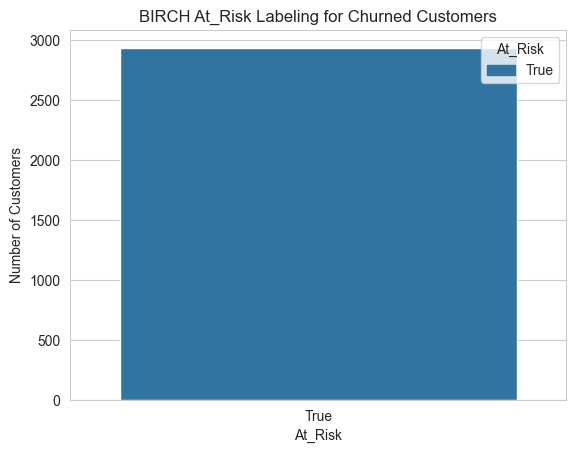

In [634]:
sns.countplot(B_data_quality_scaled[B_data_quality_scaled['Churn'] == 1], x='At_Risk', hue='At_Risk')
plt.title('BIRCH At_Risk Labeling for Churned Customers')
plt.ylabel('Number of Customers')
plt.show()

In [544]:
B_data_quality_scaled[(B_data_quality_scaled['Churn'] == 1) & (B_data_quality_scaled['At_Risk'] == False)].Quality.value_counts()

Series([], Name: count, dtype: int64)

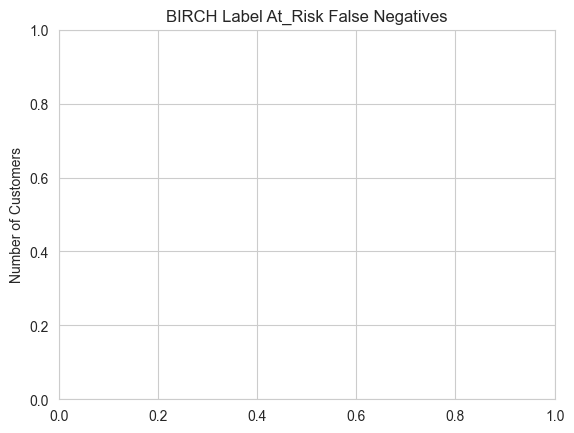

In [639]:
sns.barplot(B_data_quality_scaled[(B_data_quality_scaled['Churn'] == 1) & (B_data_quality_scaled['At_Risk'] == False)], x='Customer ID', y= 'Quality', estimator= np.count_nonzero, hue='Quality')
plt.title('BIRCH Label At_Risk False Negatives')
plt.ylabel('Number of Customers')
plt.show()

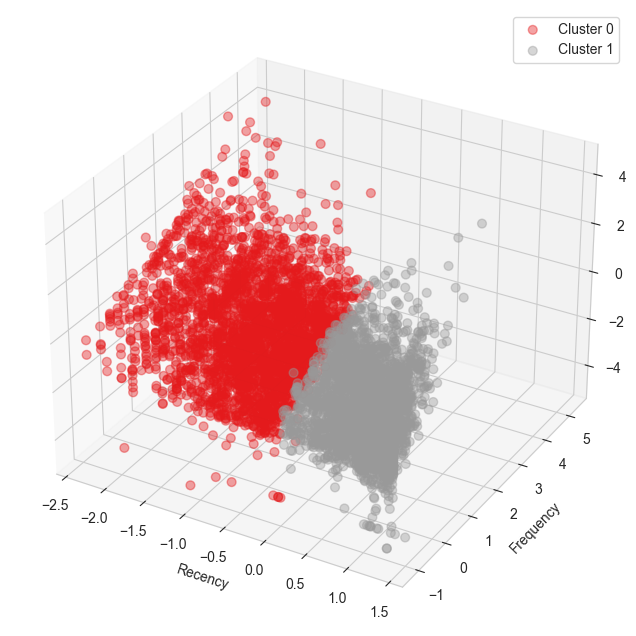

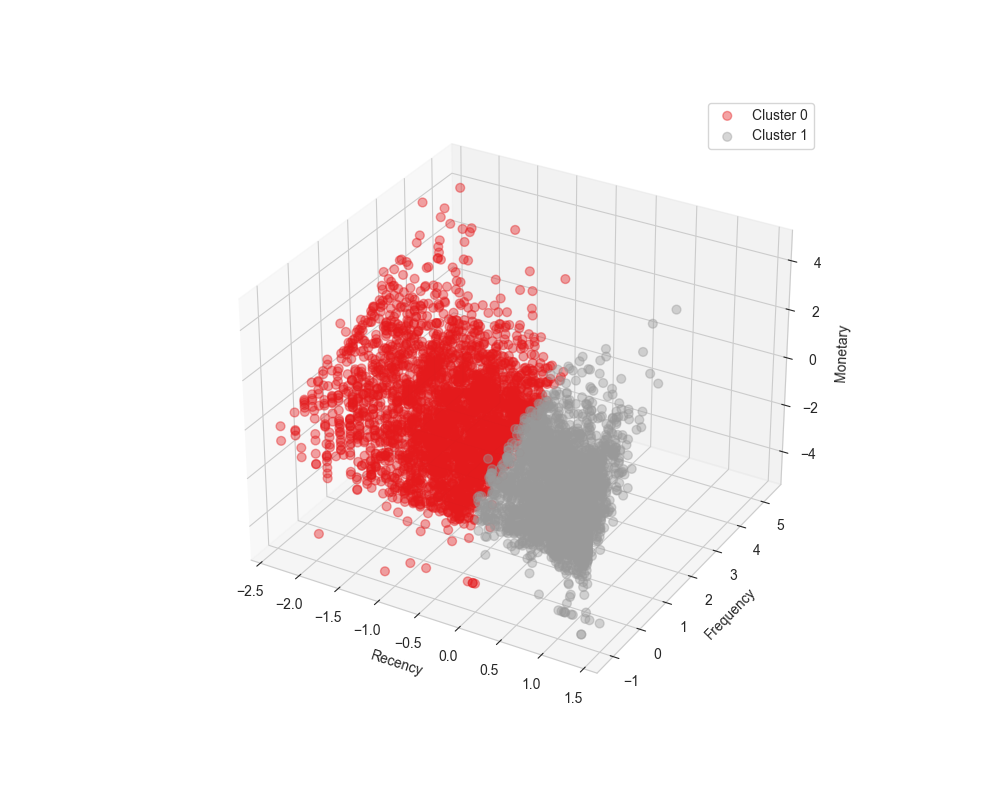

In [495]:
handler.RFM_3D_Plot(handler.rfm_quality_scaled, cluster_col = 'Churn')

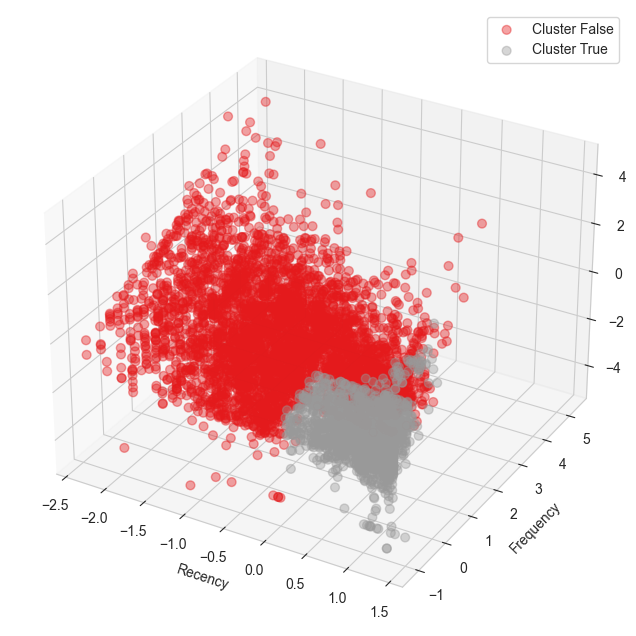

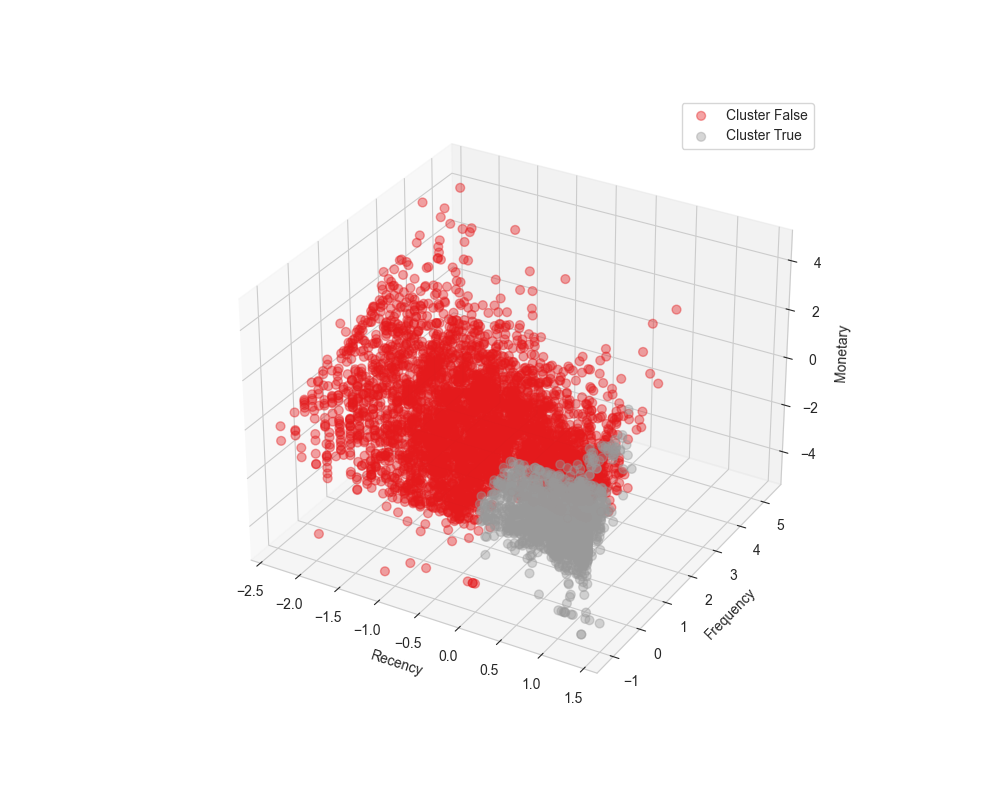

In [511]:
handler.RFM_3D_Plot(handler.rfm_quality_scaled, cluster_col='At_Risk')

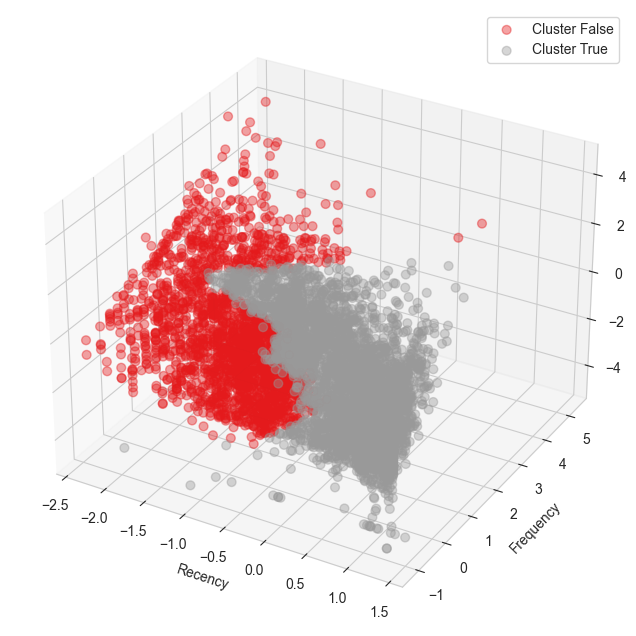

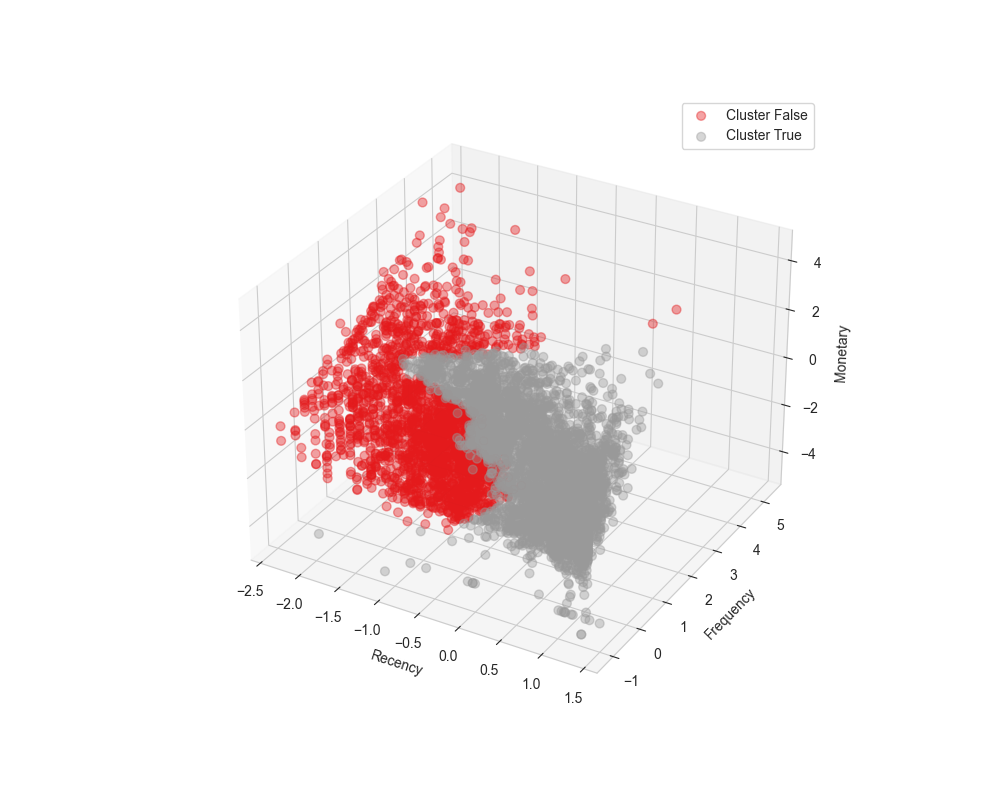

In [512]:
handler.RFM_3D_Plot(KM_data_quality_scaled, cluster_col='At_Risk')

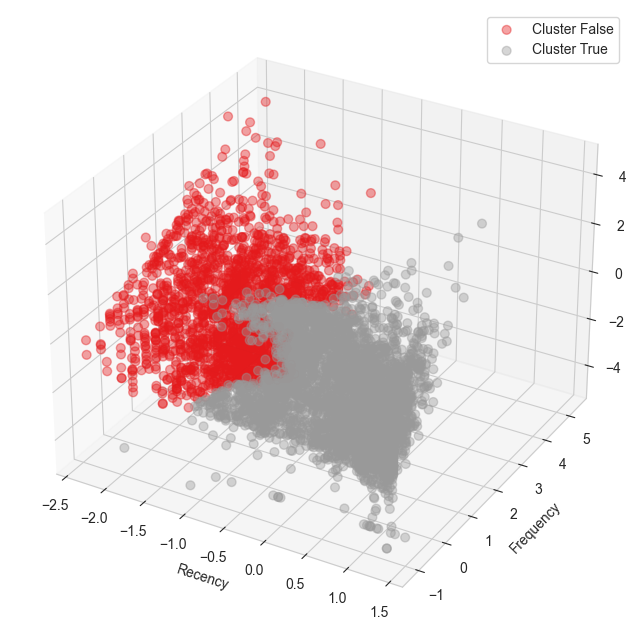

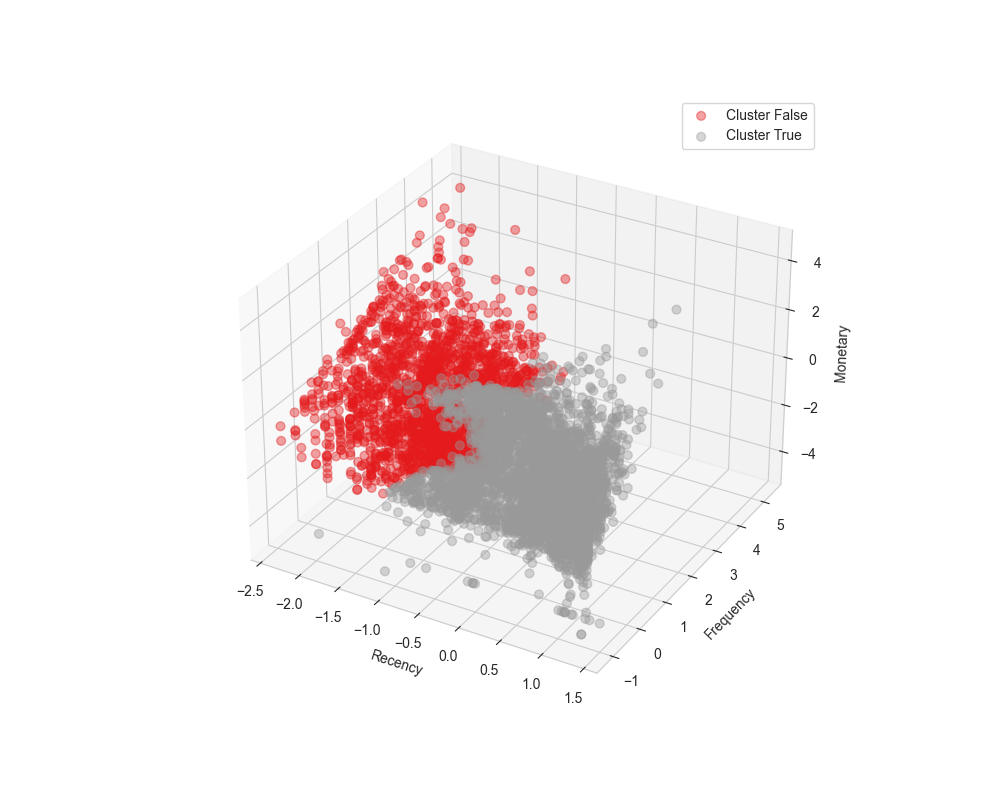

In [513]:
handler.RFM_3D_Plot(B_data_quality_scaled, cluster_col = 'At_Risk')

In [381]:
KM_Mask = {
    0	:	'Inactive_Prime_Customer',
    1	:	'New_Customer',
    2	:	'Prime_Customer',
    3	:	'Inactive_Normative_Customer',
    4	:	'Active_Normative_Customer',
    5	:	'Churned_New_Customers',
    6	:	'Likely-to-Churn_Normative_Customer',
    7	:	'Churned_Customers'
}

KM_risk_mask = {
    0 : True,
    3 : True,
    5 : True,
    6 : True,
    7 : True
}

KM_loyalty_mask = {
    2 : True
}

In [382]:
B_Mask = {
    0	:   'Prime_Customer',
    1	:	'Inactive_Prime Customer',
    2	:	'Inactive_New_Customers',
    3	:	'Normative_Customer',
    4	:	'Likely_to_Churn_Customer',
    5	:	'Inactive_Normative_Customer',
    6	:	'Sub-Prime_Customer',
    7	:	'New_Customers'
}

B_risk_mask = {
    1 : True,
    2 : True,
    4 : True,
    5 : True
}

B_loyalty_mask = {
    0 : True,
    6 : True
}

### Defining Churn

### Model Training Pipeline

In [411]:
def RFM_qual_masks(df, qual_mask, risk_mask, loyalty_mask):

    df['Quality'] = df.Cluster.map(qual_mask).fillna('Other')
    
    df['At_Risk'] = df.Cluster.map(risk_mask).fillna(False)
    
    df['Loyal_Interest'] = df.Cluster.map(loyalty_mask).fillna(False)
    
    #Add Some additional quality flags
    df['Is_High_Value'] = df.apply(lambda x : True if x['M'] >= 3 else False, axis=1)
    df['Is_High_Activity'] = df.apply(lambda x : True if x['F'] >= 4 else False, axis=1)
    df['Is_Recent'] = df.apply(lambda x : True if x['R'] <= 2 else False, axis=1)

    return df

In [412]:
def preprocess_for_training(df, churn_limit = 90):
    df_churn = df

    #Defining Churn
    MAX_DAYS_SINCE_LAST_PURCHASE = churn_limit
    current_date = df_churn['DateOfLastPurchase'].max()
    df_churn['Churn'] = ((current_date - df_churn['DateOfLastPurchase']).dt.days > MAX_DAYS_SINCE_LAST_PURCHASE).astype(int)
    df_churn = df_churn.astype({'Customer ID' : int, 'Recency': int, 'Frequency' : int, 'Monetary' : float, 'RFM_Score' : int})
    
    # Drop unnecessary columns
    df_churn = df_churn.drop(columns=['Customer ID', 'DateOfLastPurchase'])

    if 'Quality' in df_churn.columns:
        # One-Hot Encode 'Quality'
        quality_encoded = pd.get_dummies(df_churn['Quality'], prefix='Quality')
        df_churn = pd.concat([df_churn, quality_encoded], axis=1)
        df_churn = df_churn.drop(columns=['Quality'])
        
        # Convert boolean columns to integer type
        bool_cols = ['At_Risk', 'Loyal_Interest', 'Is_High_Value', 'Is_High_Activity', 'Is_Recent'] + list(quality_encoded.columns)
        for col in bool_cols:
            df_churn[col] = df_churn[col].astype(int)
    else:
        pass
    return df_churn

In [424]:
def perform_kfold_cv(X_train, y_train, cat_features=['R', 'F', 'M', 'RFM_Score']):
    from sklearn.base import clone
    # Models for Classification
    models = [('LR', LogisticRegression(max_iter=1000, random_state=5)),
              ('SGD', SGDClassifier(random_state=5, loss='log_loss')),
              ('KNN', KNeighborsClassifier()),
              ('CART', DecisionTreeClassifier(random_state=5)),
              ('RF', RandomForestClassifier(random_state=5)),
              ('SVC', SVC(gamma='auto', max_iter=1000, random_state=5, probability=True)),  # Added probability=True for SVC
              ('GBoost', GradientBoostingClassifier(random_state=5)),
              ('CatBoost', CatBoostClassifier(verbose=False, cat_features=cat_features, random_state=5)),
              ("LightGBM", LGBMClassifier(verbose= -1, random_state=5))
             ]

    results = []
    names = []
    best_models = []  # To store the best model from each cross-validation

    # Manual k-fold cross validation
    kfold = KFold(n_splits=10, random_state=5, shuffle=True)

    for name, model in models:
        fold_scores = []
        
        best_model = None
        best_score = float('-inf')  # For classification, assuming you want higher scores to be better
        
        for train_idx, valid_idx in kfold.split(X_train, y_train):
            train_data, valid_data = X_train.iloc[train_idx], X_train.iloc[valid_idx]
            train_target, valid_target = y_train.iloc[train_idx], y_train.iloc[valid_idx]
            
            temp_model = clone(model)  # Create a fresh clone of the model
            temp_model.fit(train_data, train_target)
            
            score = temp_model.score(valid_data, valid_target)
            fold_scores.append(score)
            
            if score > best_score:
                best_score = score
                best_model = temp_model

        results.append(fold_scores)
        names.append(name)
        best_models.append(best_model)
        
        msg = "%s: %f (%f)" % (name, np.mean(fold_scores), np.std(fold_scores))
        print(msg)
    
    return names, best_models, results

In [425]:
def evaluate_and_plot_models(names, best_models, X_test, y_test, set_name=None):
    import matplotlib.pyplot as plt
    from sklearn.metrics import (accuracy_score, precision_recall_curve, average_precision_score, 
                                 matthews_corrcoef, balanced_accuracy_score, cohen_kappa_score, 
                                 log_loss, roc_curve, auc, confusion_matrix)
    
    # Initialize figure for plotting
    fig, axes = plt.subplots(nrows=len(best_models), ncols=2, figsize=(20, 50))

    # Metrics storage
    metrics_data = []

    for idx, (name, model) in enumerate(zip(names, best_models)):

        # Predict on test set
        y_pred = model.predict(X_test)
        y_pred_prob = model.predict_proba(X_test)[:, 1]

        # Metrics
        acc = accuracy_score(y_test, y_pred)
        precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
        auc_pr = average_precision_score(y_test, y_pred_prob)
        mcc = matthews_corrcoef(y_test, y_pred)
        b_acc = balanced_accuracy_score(y_test, y_pred)
        kappa = cohen_kappa_score(y_test, y_pred)
        ll = log_loss(y_test, y_pred_prob) if hasattr(model, 'predict_proba') else None

        metrics_data.append([name, acc, auc_pr, mcc, b_acc, kappa, ll])

        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        roc_auc = auc(fpr, tpr)

        axes[idx, 0].plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
        axes[idx, 0].plot([0, 1], [0, 1], color='navy', linestyle='--')
        axes[idx, 0].set_xlim([0.0, 1.0])
        axes[idx, 0].set_ylim([0.0, 1.05])
        axes[idx, 0].set_xlabel('False Positive Rate')
        axes[idx, 0].set_ylabel('True Positive Rate')
        axes[idx, 0].set_title(f'{set_name} ROC Curve for %s' % name)
        axes[idx, 0].legend(loc="lower right")

        # Confusion matrix
        cf_matrix = confusion_matrix(y_test, y_pred)
        cax = axes[idx, 1].imshow(cf_matrix, cmap='Blues')
        axes[idx, 1].set_title(f'{set_name} Confusion Matrix for %s' % name)
        axes[idx, 1].set_xlabel('Predicted')
        axes[idx, 1].set_ylabel('True')
        axes[idx, 1].set_xticks([0,1])
        axes[idx, 1].set_yticks([0,1])
        axes[idx, 1].set_xticklabels(['Churn=0', 'Churn=1'])
        axes[idx, 1].set_yticklabels(['Churn=0', 'Churn=1'])

        # Add annotations to the heatmap
        for i in range(cf_matrix.shape[0]):
            for j in range(cf_matrix.shape[1]):
                axes[idx, 1].text(j, i, cf_matrix[i, j], ha='center', va='center', color='lime')

    fig.tight_layout()
    plt.show()

    # Convert metrics data to DataFrame
    columns = ['Model', 'Accuracy', 'AUC-PR', 'MCC', 'Balanced Accuracy', 'Cohen\'s Kappa', 'Log Loss']
    metrics_df = pd.DataFrame(metrics_data, columns=columns)
    display(metrics_df)

### Model Comparisons

In [621]:
B_data_scaled = pd.concat([handler.rfm_scaled, pd.Series(B_labels)], axis=1).rename(columns={0:'Cluster'})
B_data_quality_scaled = RFM_qual_masks(B_data_scaled, B_Mask, B_risk_mask, B_loyalty_mask)

KM_data_scaled = pd.concat([handler.rfm_scaled, pd.Series(handler.rfm_KM_cluster.Cluster)], axis=1).rename(columns={0:'Cluster'})
KM_data_quality_scaled = RFM_qual_masks(KM_data_scaled, KM_Mask, KM_risk_mask, KM_loyalty_mask)

In [427]:
datasets = [
    ('RFM_wo_Qualities', handler.rfm_scaled),
    ('Manual_Qualitative', handler.rfm_quality_scaled),
    ('KMeans', KM_data_quality_scaled),
    ('Birch', B_data_quality_scaled)
]

In [428]:
plt.clf()
plt.cla()
plt.close()
%matplotlib inline 

RFM_wo_Qualities
LR: 0.990393 (0.003345)
SGD: 0.989540 (0.003501)
KNN: 0.990393 (0.003345)
CART: 0.982492 (0.007145)
RF: 0.986338 (0.003602)
SVC: 0.990393 (0.003345)
GBoost: 0.989326 (0.004166)
CatBoost: 0.990393 (0.003345)
LightGBM: 0.986550 (0.004688)
RFM_wo_Qualities


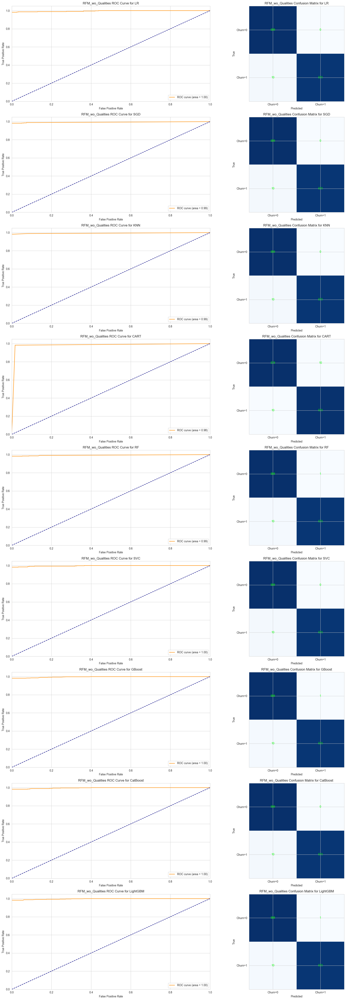

,Model,Accuracy,AUC-PR,MCC,Balanced Accuracy,Cohen's Kappa,Log Loss
0,LR,0.991468,0.996502,0.983076,0.991424,0.982933,0.037147
1,SGD,0.991468,0.994398,0.983076,0.991424,0.982933,0.307540
2,KNN,0.991468,0.994311,0.983076,0.991424,0.982933,0.200438
3,CART,0.982935,0.974521,0.965869,0.982935,0.965869,0.615079
4,RF,0.990614,0.994822,0.981342,0.990575,0.981227,0.181115
5,SVC,0.991468,0.997770,0.983076,0.991424,0.982933,0.041815
6,GBoost,0.990614,0.997282,0.981342,0.990575,0.981227,0.039479
7,CatBoost,0.991468,0.997274,0.983076,0.991424,0.982933,0.038616
8,LightGBM,0.990614,0.997503,0.981342,0.990575,0.981227,0.050216


Manual_Qualitative
LR: 0.990393 (0.003345)
SGD: 0.968645 (0.062793)
KNN: 0.990180 (0.003338)
CART: 0.982706 (0.006794)
RF: 0.986764 (0.004255)
SVC: 0.990393 (0.003345)
GBoost: 0.989326 (0.004166)
CatBoost: 0.990393 (0.003345)
LightGBM: 0.986764 (0.004760)
Manual_Qualitative


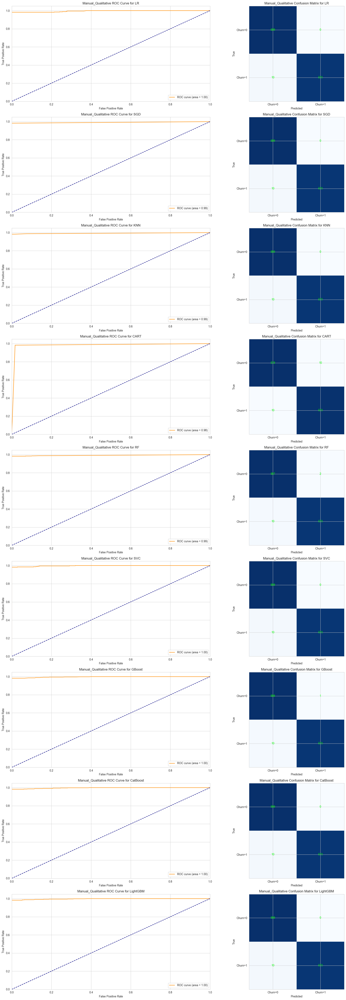

,Model,Accuracy,AUC-PR,MCC,Balanced Accuracy,Cohen's Kappa,Log Loss
0,LR,0.991468,0.996123,0.983076,0.991424,0.982933,0.038891
1,SGD,0.991468,0.991380,0.983076,0.991424,0.982933,0.307540
2,KNN,0.991468,0.993601,0.983076,0.991424,0.982933,0.229984
3,CART,0.982935,0.974521,0.965869,0.982935,0.965869,0.615079
4,RF,0.989761,0.993480,0.979612,0.989726,0.979520,0.234116
5,SVC,0.991468,0.997849,0.983076,0.991424,0.982933,0.041826
6,GBoost,0.990614,0.997329,0.981342,0.990575,0.981227,0.039248
7,CatBoost,0.991468,0.997363,0.983076,0.991424,0.982933,0.038392
8,LightGBM,0.991468,0.997573,0.983076,0.991424,0.982933,0.049981


KMeans
LR: 0.990606 (0.003339)
SGD: 0.977574 (0.037579)
KNN: 0.989966 (0.003707)
CART: 0.982706 (0.006304)
RF: 0.987191 (0.003824)
SVC: 0.990393 (0.003345)
GBoost: 0.989753 (0.003418)
CatBoost: 0.990393 (0.003206)
LightGBM: 0.988045 (0.004186)
KMeans


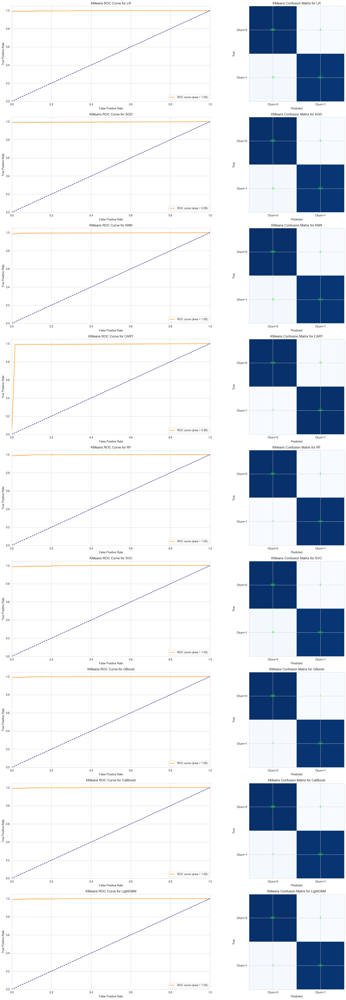

,Model,Accuracy,AUC-PR,MCC,Balanced Accuracy,Cohen's Kappa,Log Loss
0,LR,0.991468,0.998902,0.983076,0.991424,0.982933,0.027925
1,SGD,0.991468,0.994828,0.983076,0.991424,0.982933,0.307540
2,KNN,0.991468,0.996124,0.983076,0.991424,0.982933,0.138510
3,CART,0.985495,0.977106,0.971002,0.985508,0.970990,0.522817
4,RF,0.989761,0.998425,0.979527,0.989752,0.979521,0.059187
5,SVC,0.991468,0.998167,0.983076,0.991424,0.982933,0.037390
6,GBoost,0.993174,0.998873,0.986399,0.993148,0.986347,0.027217
7,CatBoost,0.994027,0.998957,0.988124,0.993997,0.988054,0.026388
8,LightGBM,0.992321,0.998871,0.984676,0.992299,0.984641,0.032852


Birch
LR: 0.990393 (0.003345)
SGD: 0.988472 (0.004188)
KNN: 0.990393 (0.003346)
CART: 0.982492 (0.005959)
RF: 0.987619 (0.003675)
SVC: 0.990393 (0.003345)
GBoost: 0.989966 (0.003451)
CatBoost: 0.990180 (0.003338)
LightGBM: 0.986978 (0.004628)
Birch


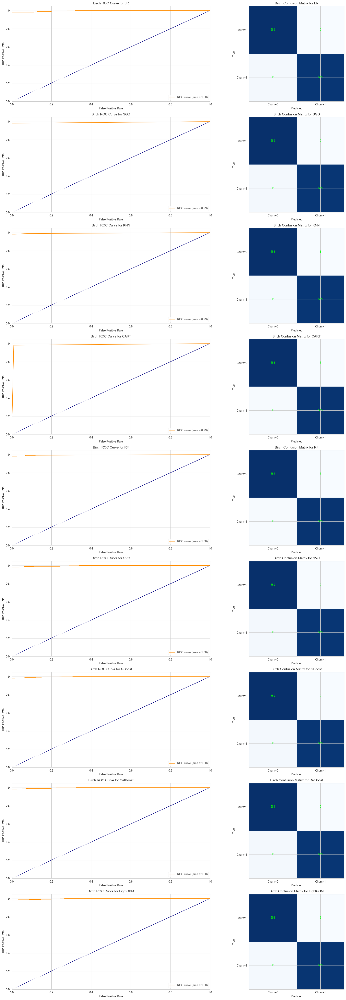

,Model,Accuracy,AUC-PR,MCC,Balanced Accuracy,Cohen's Kappa,Log Loss
0,LR,0.991468,0.997228,0.983076,0.991424,0.982933,0.035768
1,SGD,0.991468,0.991380,0.983076,0.991424,0.982933,0.308120
2,KNN,0.990614,0.994331,0.981342,0.990575,0.981227,0.201140
3,CART,0.986348,0.981195,0.972717,0.986330,0.972695,0.492064
4,RF,0.985495,0.995868,0.971001,0.985481,0.970988,0.151847
5,SVC,0.991468,0.997770,0.983076,0.991424,0.982933,0.042305
6,GBoost,0.991468,0.998122,0.983076,0.991424,0.982933,0.036573
7,CatBoost,0.991468,0.997881,0.983076,0.991424,0.982933,0.036644
8,LightGBM,0.988908,0.997963,0.977884,0.988877,0.977814,0.050998


In [429]:
for set_name, data in datasets:
    df_churn = preprocess_for_training(data)
    
    #grab cat features
    cat_features = ['R', 'F', 'M', 'RFM_Score']

    #split into train and test data
    X = df_churn.drop(columns=['Churn']).reset_index().drop(columns=['index'])
    y = df_churn['Churn']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

    print(set_name)
    names, best_models, results = perform_kfold_cv(X_train, y_train, cat_features)
    dump(zip(names, best_models), f'{set_name}_name_best_model_zip.gz')
    print(set_name)
    evaluate_and_plot_models(names, best_models, X_test, y_test, set_name)

## Future Work

### Continuous Transactional Churn Model

### Feature Engineering
**Proposed:**

add columns for:
 - rolling/cumulative total # of transactions
 - rolling/cumulative per customer purchase total (qty & \$)
 - rolling avg purchase qty
 - rolling avg purchase $ amt
 - time since last purchase
 - rolling avg time between purchase